<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Часть кода с загрузкой данных написана за вас. Всю содержательную сторону вопроса вам нужно заполнить самостоятельно. Задание оценивается из 15 баллов. 

Обратите внимание, что отчёт по заданию стоит целых 6 баллов. Он вынесен в отдельный пункт в конце тетради. Это сделано для того, чтобы тетрадь была оформлена как законченный документ о проведении экспериментов. Неотъемлемой составляющей отчёта является ответ на следующие вопросы:

* Что было сделано? Что получилось реализовать, что не получилось?
* Какие результаты ожидалось получить?
* Какие результаты были достигнуты?
* Чем результаты различных подходов отличались друг от друга и от бейзлайна (если таковой присутствует)?




---


1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>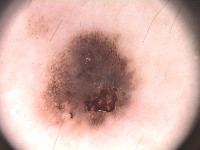</td><td>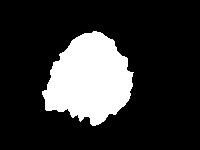</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
!unrar x /content/gdrive/MyDrive/PH2Dataset.rar


UNRAR 5.61 beta 1 freeware      Copyright (c) 1993-2018 Alexander Roshal


Extracting from /content/gdrive/MyDrive/PH2Dataset.rar

Creating    PH2Dataset                                                OK
Extracting  PH2Dataset/PH2_dataset.txt                                     0%  OK 
Extracting  PH2Dataset/PH2_dataset.xlsx                                    0%  OK 
Extracting  PH2Dataset/Readme.txt                                          0%  OK 
Creating    PH2Dataset/PH2 Dataset images                             OK
Creating    PH2Dataset/PH2 Dataset images/IMD002                      OK
Creating    PH2Dataset/PH2 Dataset images/IMD002/IMD002_Dermoscopic_Image  OK
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_Dermoscopic_Image/IMD002.bmp       0%  OK 
Creating    PH2Dataset/PH2 Dataset images/IMD002/IMD002_lesion        OK
Extracting  PH2Dataset/PH2 Dataset images/IMD002/IMD002_lesion/IMD002_lesion.bmp       0%  OK 
Creating  

In [3]:
!ls

gdrive	PH2Dataset  sample_data


Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [4]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [5]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [6]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [7]:
len(lesions)

200

Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

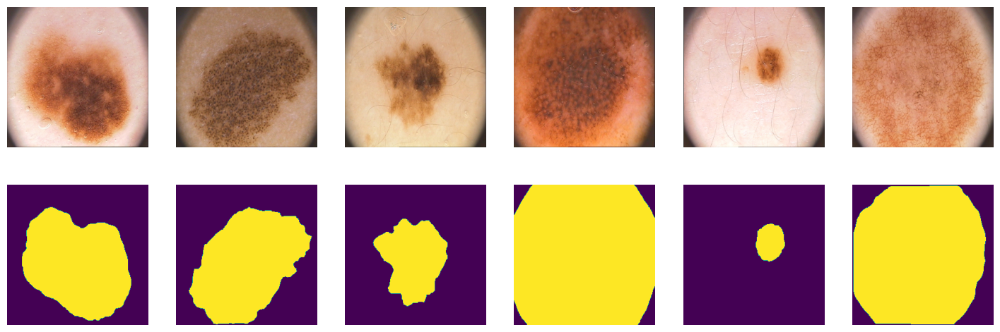

In [8]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 140/30/30
 для обучения, валидации и теста соответственно

In [9]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [140, 170])

In [10]:
print(len(tr), len(val), len(ts))

140 30 30


#### PyTorch DataLoader

In [11]:
from torch.utils.data import DataLoader
batch_size = 10
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])), 
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [12]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

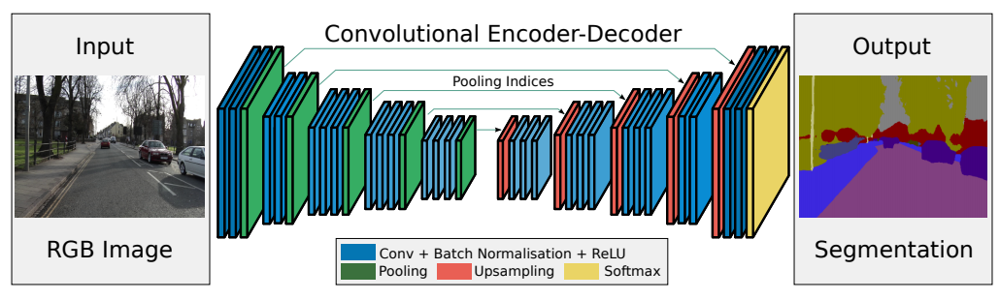

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [14]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU()
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.enc_conv4 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU()
        )
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),  
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU()
        )
        self.upsample1 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU()
        )
        self.upsample2 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.upsample3 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.upsample4 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec_conv4 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=1),
        )

    def forward(self, x):
        # encoder
        e0, indices0 = self.pool0(self.enc_conv0(x))
        e1, indices1 = self.pool1(self.enc_conv1(e0))
        e2, indices2 = self.pool2(self.enc_conv2(e1))
        e3, indices3 = self.pool3(self.enc_conv3(e2))
        e4, indices4 = self.pool4(self.enc_conv4(e3))

        # decoder
        d0 = self.dec_conv0(self.upsample0(e4, indices4))
        d1 = self.dec_conv1(self.upsample1(d0, indices3))
        d2 = self.dec_conv2(self.upsample2(d1, indices2))
        d3 = self.dec_conv3(self.upsample3(d2, indices1))
        d4 = self.dec_conv4(self.upsample4(d3, indices0))
        return d4

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Для примера посмотрим на истину (слева) и предсказание (справа):
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


Тогда пересечение и объединение будет выглядеть так:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

In [15]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return thresholded  # 

## Функция потерь [1 балл]

Не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации. 

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [16]:
def bce_loss(y_pred, y_real):
    loss = y_pred - y_real * y_pred + torch.log(1 + torch.exp(-y_pred))
    return loss.mean()

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [17]:
def train(model, opt, scheduler, loss_fn, score_model, epochs, data_tr, data_val):
    torch.cuda.empty_cache()
    X_val, Y_val = next(iter(data_val))
    train_losses = []
    val_losses = []
    train_scores = []
    val_scores = []

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))

        avg_loss = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            # data to device
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_pred, Y_batch) # forward-pass
            loss.backward() # backward-pass
            opt.step() # update weights
            # calculate loss to show the user
            avg_loss += loss / len(data_tr)
        toc = time()
        print('loss: %f' % avg_loss)
        train_losses.append(avg_loss.item())

        # train_score
        avg_train_score = score_model(model, iou_pytorch, data_tr)
        print('train_score: %f' % avg_train_score)
        train_scores.append(avg_train_score)

        # val_loss
        avg_val_loss = 0
        model.eval()  # testing mode
        for X_val, Y_val in data_val:
            with torch.no_grad():
                Y_hat = model(X_val.to(device)).detach().cpu() # detach and put into cpu
                loss = loss_fn(Y_hat, Y_val) # forward-pass
                avg_val_loss += loss / len(data_val)

        print('val_loss: %f' % avg_val_loss)
        val_losses.append(avg_val_loss.item())

        # val_score
        avg_val_score = score_model(model, iou_pytorch, data_val)
        print('val_score: %f' % avg_val_score)
        val_scores.append(avg_val_score)

        # scheduler step
        scheduler.step(avg_val_loss)

        torch.cuda.empty_cache()

        # Visualize tools
        clear_output(wait=True)
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, 6, k+7)
            plt.imshow(Y_hat[k, 0], cmap='gray')
            plt.title('Output')
            plt.axis('off')
        plt.suptitle('%d / %d - val_score: %f' % (epoch+1, epochs, avg_val_score))
        plt.show()

    plt.figure(figsize=(16, 10))
    plt.plot(range(epochs), train_losses, label="train_losses", linewidth=2)
    plt.plot(range(epochs), val_losses, label="val_losses", linewidth=2)
    plt.plot(range(epochs), train_scores, label="train_scores", linewidth=2)
    plt.plot(range(epochs), val_scores, label="val_scores", linewidth=2)
    plt.legend()
    plt.xlabel("Epoch")
    plt.show()

    return (train_losses, val_losses, train_scores, val_scores)

## Инференс [1 балл]


In [18]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    scores = 0
    for X_batch, Y_label in data:
        with torch.no_grad():
            Y_pred = (model(X_batch.to(device)) > 0.5).int()
            scores += metric(Y_pred, Y_label.to(device)).mean().item()

    return scores / len(data)

## Основной момент: обучение

Обучите вашу модель. Обратите внимание, что обучать необходимо до сходимости. Если указанного количества эпох (20) не хватило, попробуйте изменять количество эпох до сходимости алгоритма. Сходимость определяйте по изменению функции потерь на валидационной выборке.
 С параметрами оптимизатора можно спокойно играть, пока вы не найдете лучший вариант для себя.


In [19]:
model = SegNet().to(device)

In [20]:
max_epochs = 50

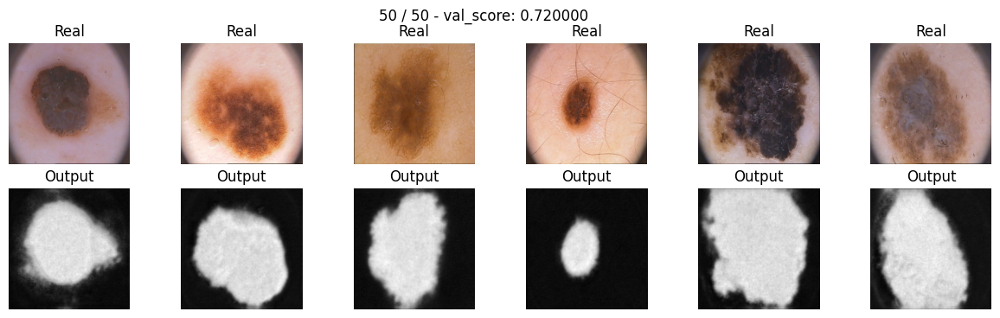

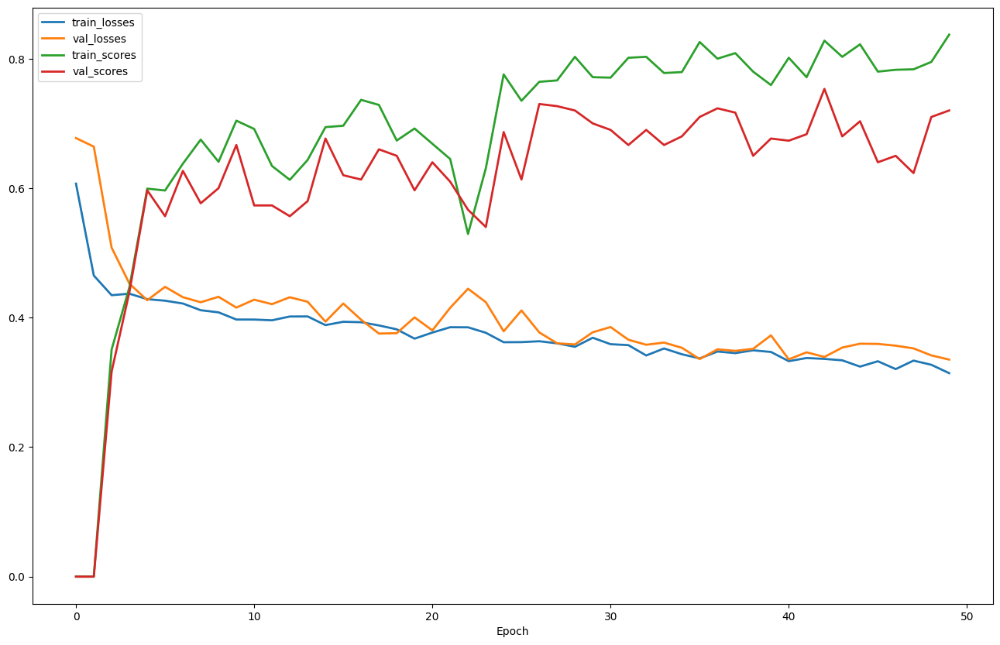

In [21]:
optim = torch.optim.AdamW(model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
segnet_bce_train_losses, segnet_bce_val_losses, segnet_bce_train_scores, segnet_bce_val_scores = train(model, optim, scheduler, bce_loss, score_model, max_epochs, data_tr, data_val)

In [22]:
print('Validation score:', score_model(model, iou_pytorch, data_val))
print('Test score:', score_model(model, iou_pytorch, data_ts))

Validation score: 0.7200000484784445
Test score: 0.7833333611488342


Ответьте себе на вопрос: не переобучается ли моя модель?

Модель начала переобучаться, потому что стал заметен большой разрыв между скорами на валидационной выборке и обучающей выборке. Это вполне естественно, т.к. данных для обучения очень мало, поэтому сеть их вролне может запомнить. Тем не менее, она не сильно переобучилась.

-----------------------------------------------------------------------------------------

## Дополнительные функции потерь [2 балла] 

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss. 
 Если у вас что-то не учится, велика вероятность, что вы ошиблись или учите слишком мало эпох, прежде чем бить тревогу попробуйте перебрать различные варианты и убедитесь, что во всех других сетапах сеть достигает желанного результата. СПОЙЛЕР: учиться она будет при всех лоссах, предложенных в этом задании.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \frac{\sum_i2X_iY_i}{\sum_iX_i+Y_i}.$$

Не забудьте подумать о численной нестабильности, возникающей в математической формуле.


In [23]:
def dice_loss(y_pred, y_real):
    smooth = 1e-8
    y_pred = (torch.sigmoid(y_pred)).view(-1)
    y_real = y_real.view(-1)
    intersection = (y_pred * y_real).sum()
    dice = (2. * intersection + smooth) / (y_pred.sum() + y_real.sum() + smooth)

    return 1 - dice

Проводим тестирование:

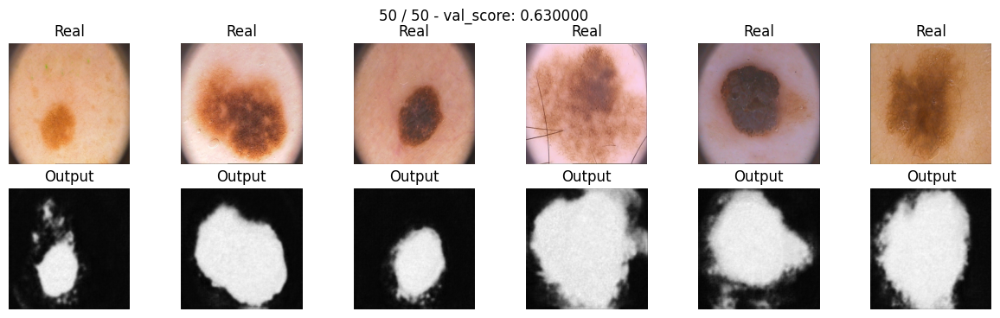

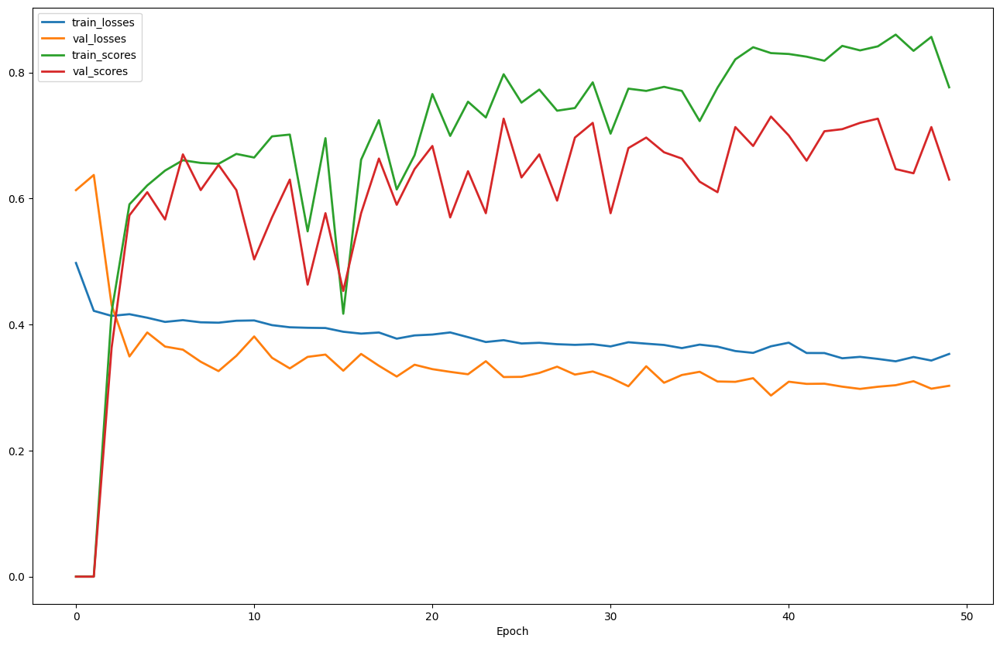

In [24]:
del model
model_dice = SegNet().to(device)
optim = torch.optim.AdamW(model_dice.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
segnet_dice_train_losses, segnet_dice_val_losses, segnet_dice_train_scores, segnet_dice_val_scores = train(model_dice, optim, scheduler, dice_loss, score_model, max_epochs, data_tr, data_val)

In [25]:
print('Validation score:', score_model(model_dice, iou_pytorch, data_val))
print('Test score:', score_model(model_dice, iou_pytorch, data_ts))

Validation score: 0.6300000150998434
Test score: 0.6933333476384481


[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf) 

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [26]:
def focal_loss(y_pred, y_real, eps = 1e-8, gamma = 2):
    y_pred = (torch.sigmoid(y_pred)).view(-1)
    y_real = y_real.view(-1)
    BCE = F.binary_cross_entropy(y_pred, y_real, reduction='mean')
    BCE_exp = torch.exp(-BCE) # instead of torch.clamp we can use torch.exp(-BCE). It will do the same to avoid numerical instability if probability equals 0
    focal_loss = (1 - BCE_exp) ** gamma * BCE
    return focal_loss.mean()


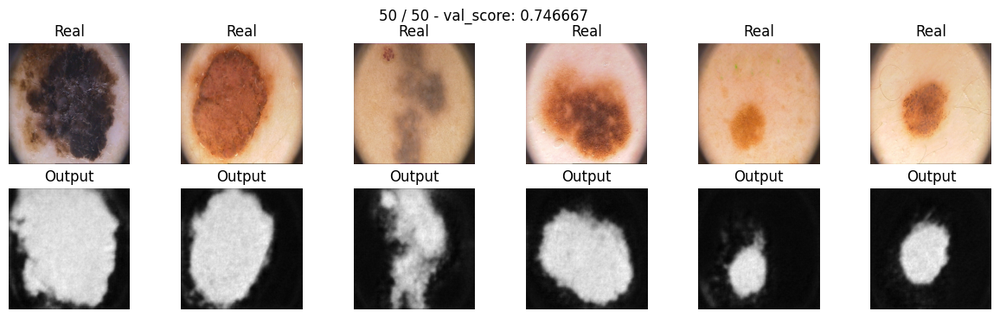

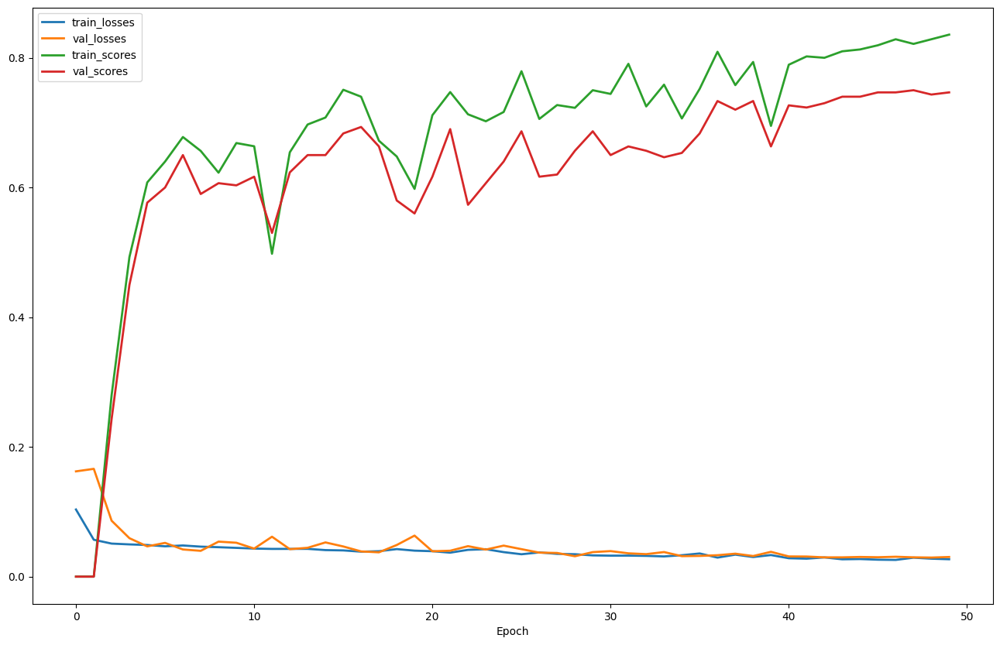

In [27]:
del model_dice
model_focal = SegNet().to(device)
optim = torch.optim.AdamW(model_focal.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
segnet_focal_train_losses, segnet_focal_val_losses, segnet_focal_train_scores, segnet_focal_val_scores = train(model_focal, optim, scheduler, focal_loss, score_model, max_epochs, data_tr, data_val)

In [28]:
print('Validation score:', score_model(model_focal, iou_pytorch, data_val))
print('Test score:', score_model(model_focal, iou_pytorch, data_ts))

Validation score: 0.746666669845581
Test score: 0.7800000111262003


----------------------------------------------------------------------------------------------

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме тако провести численное сравнение с предыдущими функциями.
Какие варианты? 

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Любой другой 

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

Так как Тверский лосс очень похож на данные выше, то за него будет проставлено только 3 балла (при условии, если в модели нет ошибок при обучении). Постарайтесь сделать что-то интереснее.

#### DICE BCE Loss

In [29]:
def dice_bce_loss(y_pred, y_true):
    dice = dice_loss(y_pred, y_true)
    bce = bce_loss(y_pred, y_true)
    return (bce + dice) / 2

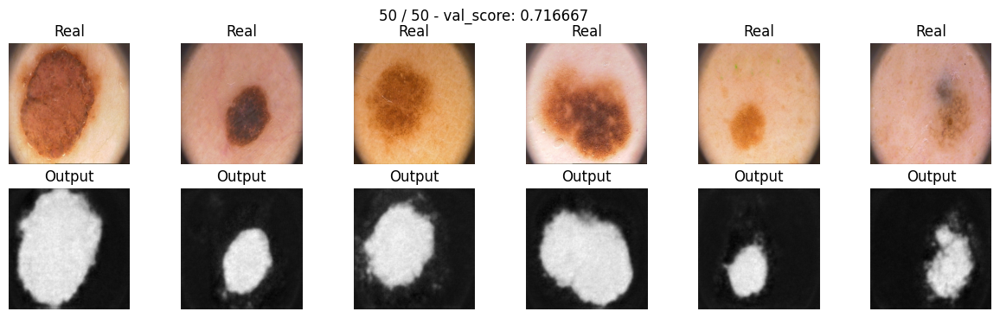

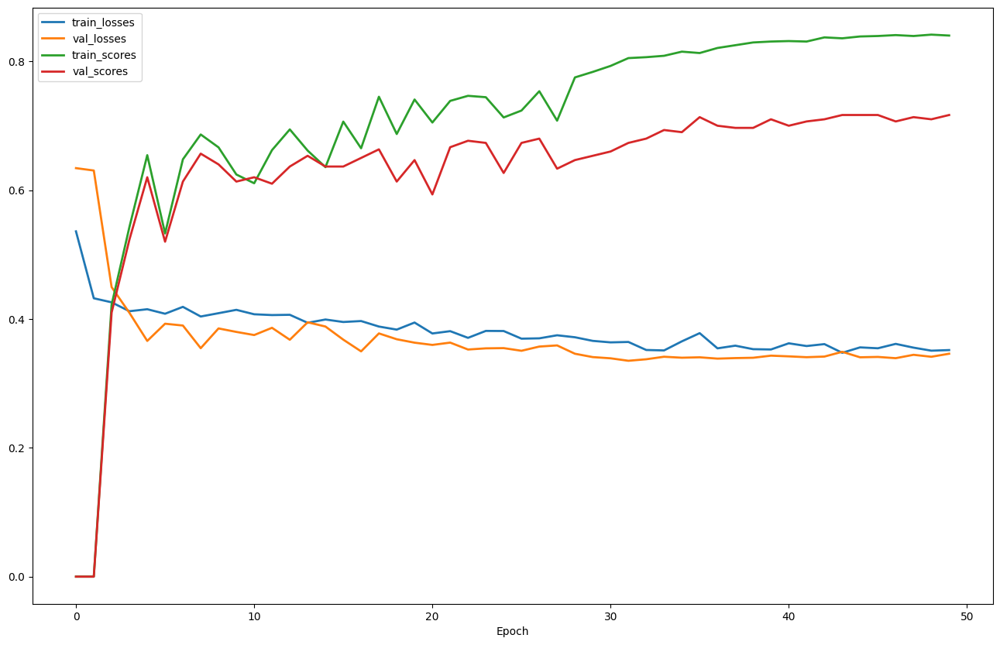

In [30]:
del model_focal
model_dice_bce = SegNet().to(device)
optim = torch.optim.AdamW(model_dice_bce.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
segnet_dice_bce_train_losses, segnet_dice_bce_val_losses, segnet_dice_bce_train_scores, segnet_dice_bce_val_scores = train(model_dice_bce, optim, scheduler, dice_bce_loss, score_model, max_epochs, data_tr, data_val)

In [31]:
print('Validation score:', score_model(model_dice_bce, iou_pytorch, data_val))
print('Test score:', score_model(model_dice_bce, iou_pytorch, data_ts))

Validation score: 0.7166667183240255
Test score: 0.793333371480306


#### Tversky Loss

In [32]:
def tversky_loss(y_pred, y_real, alpha=0.3, beta = 0.7, smooth=1e-6):
    y_pred = torch.sigmoid(y_pred).view(-1)
    y_real = y_real.view(-1)
    TP = (y_pred * y_real).sum()
    FP = ((1 - y_real) * y_pred).sum()
    FN = (y_real * (1 - y_pred)).sum()
    
    tversky = (TP + smooth) / (TP + alpha * FP + beta * FN + smooth)  
    
    return (1 - tversky).mean()

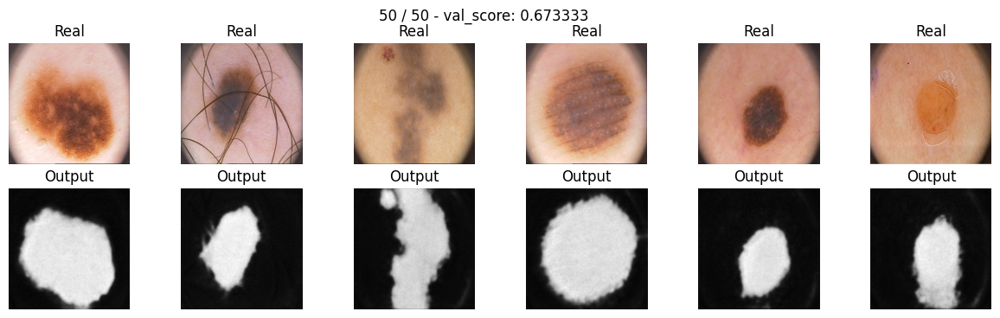

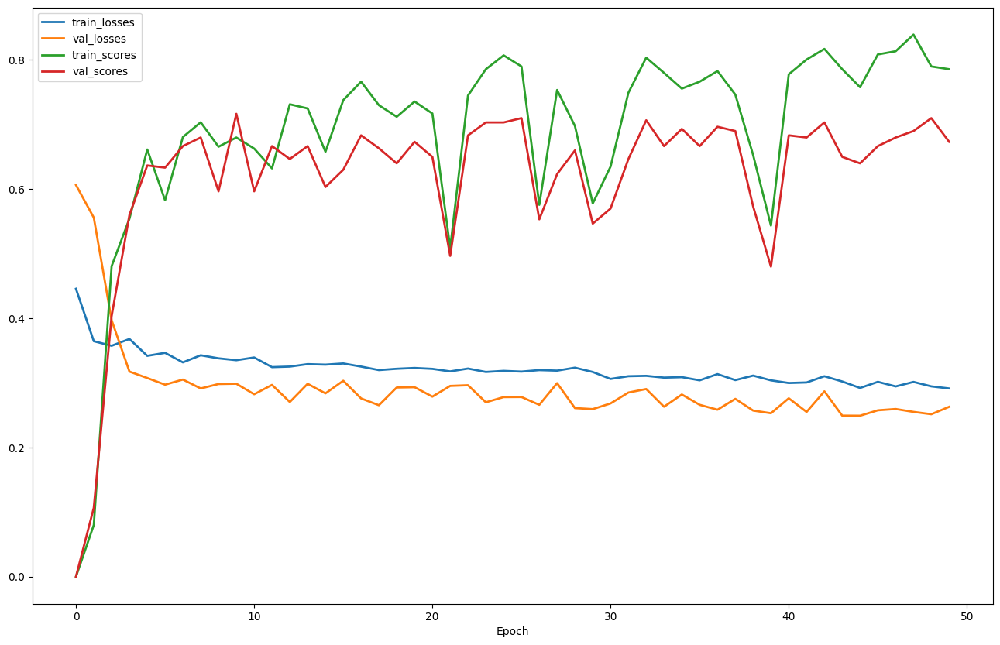

In [33]:
del model_dice_bce
model_tversky = SegNet().to(device)
optim = torch.optim.AdamW(model_tversky.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
segnet_tversky_train_losses, segnet_tversky_val_losses, segnet_tversky_train_scores, segnet_tversky_val_scores = train(model_tversky, optim, scheduler, tversky_loss, score_model, max_epochs, data_tr, data_val)

In [34]:
print('Validation score:', score_model(model_tversky, iou_pytorch, data_val))
print('Test score:', score_model(model_tversky, iou_pytorch, data_ts))

Validation score: 0.6733333667119344
Test score: 0.7766666809717814


#### Focal Tversky Loss

In [35]:
def focal_tversky_loss(y_pred, y_real, alpha=0.3, beta = 0.7, smooth=1e-6, gamma=2):
    y_pred = torch.sigmoid(y_pred)
    y_pred = y_pred.reshape(-1)
    y_real = y_real.reshape(-1)
    
    #True Positives, False Positives & False Negatives 
    TP = (y_pred * y_real).sum()
    FP = ((1 - y_real) * y_pred).sum()
    FN = (y_real * (1 - y_pred)).sum()
    tversky = (TP + smooth) / (TP + alpha * FP + beta * FN + smooth)
    focal_tversky = (1 - tversky) ** gamma
    
    return focal_tversky.mean()

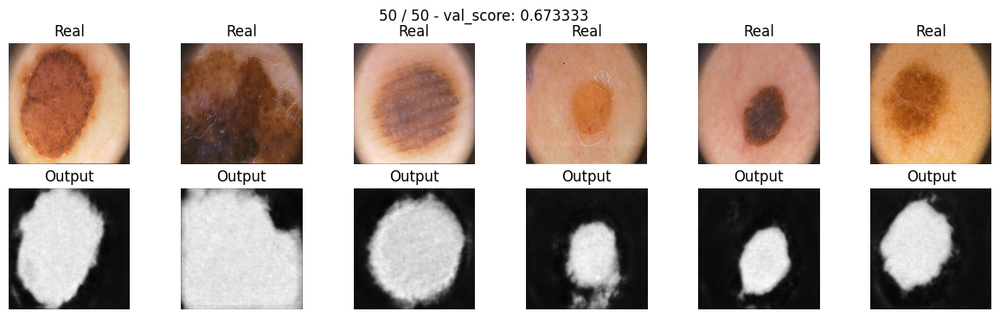

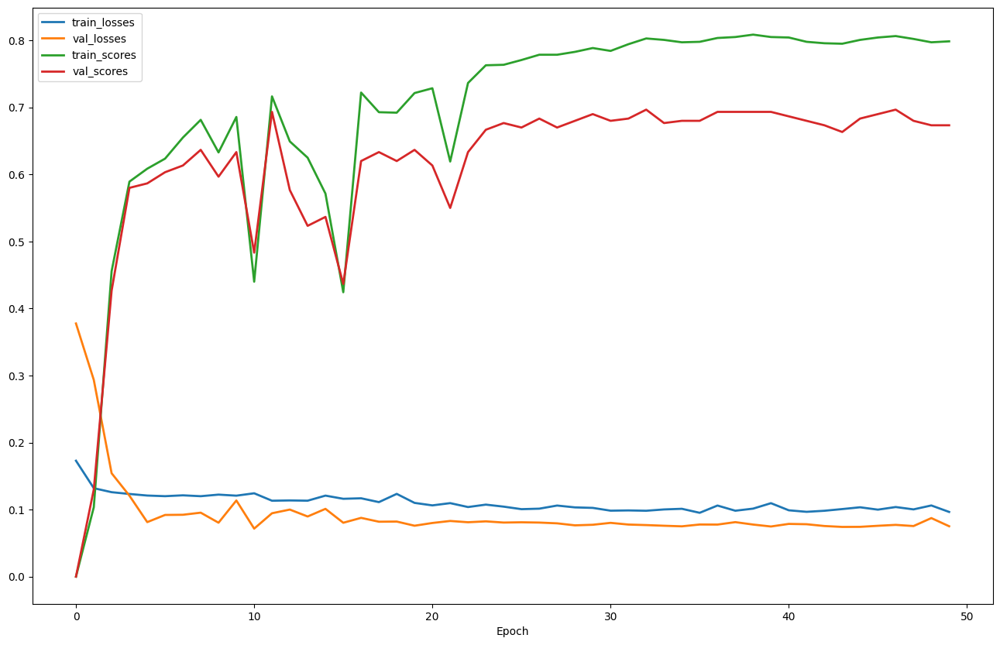

In [36]:
del model_tversky
model_focal_tversky = SegNet().to(device)
optim = torch.optim.AdamW(model_focal_tversky.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
segnet_focal_tversky_train_losses, segnet_focal_tversky_val_losses, segnet_focal_tversky_train_scores, segnet_focal_tversky_val_scores = train(model_focal_tversky, optim, scheduler, focal_tversky_loss, score_model, max_epochs, data_tr, data_val)

In [37]:
print('Validation score:', score_model(model_focal_tversky, iou_pytorch, data_val))
print('Test score:', score_model(model_focal_tversky, iou_pytorch, data_ts))
del model_focal_tversky

Validation score: 0.6733333468437195
Test score: 0.7866666913032532


-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

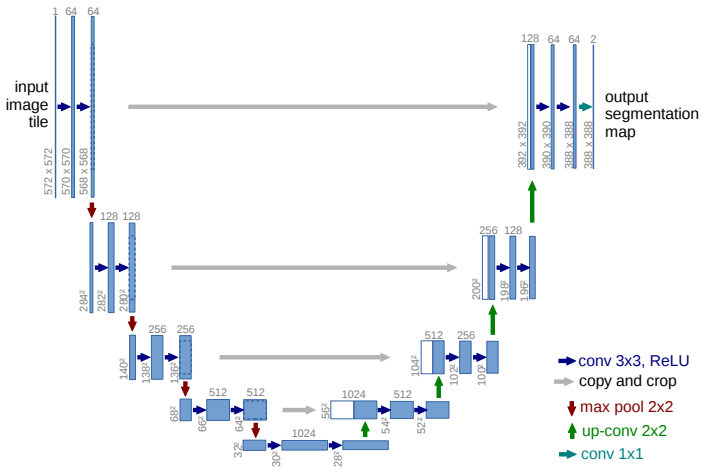

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [38]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.pool0 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=1024),
            nn.ReLU(),
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
        )

        # decoder (upsampling)
        self.upsample0 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, stride=1, padding=1),  
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
        )
        self.upsample1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
        )
        self.upsample2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
        )
        self.upsample3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=1),
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        x = self.pool0(e0)
        e1 = self.enc_conv1(x)
        x = self.pool1(e1)
        e2 = self.enc_conv2(x)
        x = self.pool2(e2)
        e3 = self.enc_conv3(x)
        x = self.pool3(e3)

        # bottleneck
        bottleneck = self.bottleneck(x)

        # decoder
        d0 = self.dec_conv0(torch.cat([self.upsample0(bottleneck), e3], dim=1))
        d1 = self.dec_conv1(torch.cat([self.upsample1(d0), e2], dim=1))
        d2 = self.dec_conv2(torch.cat([self.upsample2(d1), e1], dim=1))
        d3 = self.dec_conv3(torch.cat([self.upsample3(d2), e0], dim=1))
        return d3

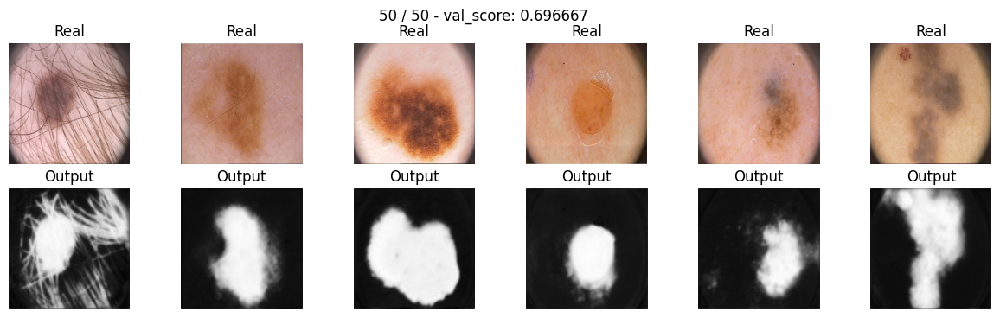

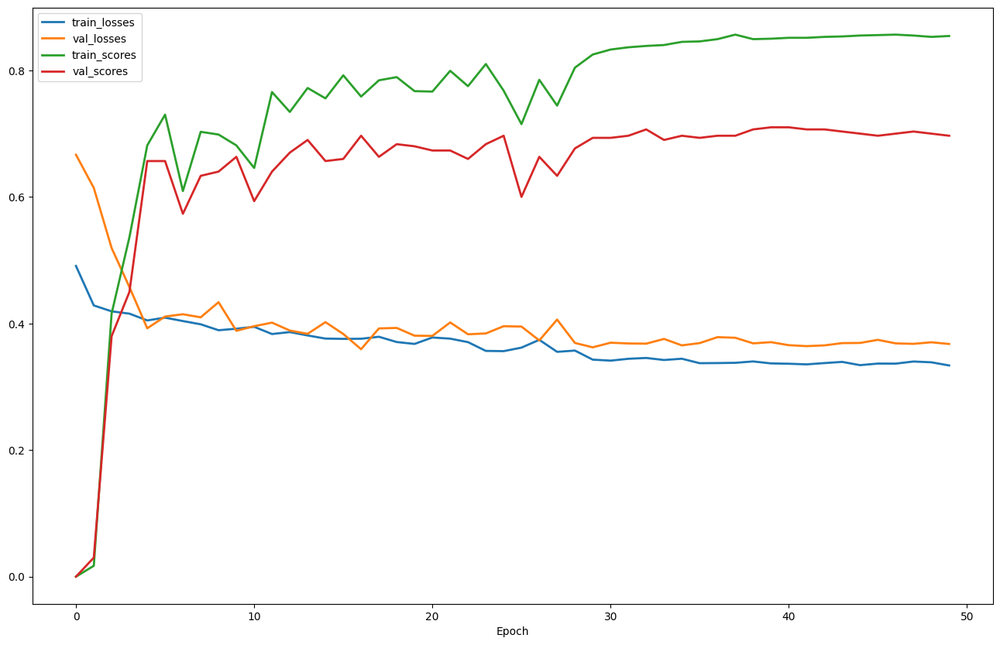

In [39]:
unet_model_bce = UNet().to(device)
optim = torch.optim.AdamW(unet_model_bce.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet_bce_train_losses, unet_bce_val_losses, unet_bce_train_scores, unet_bce_val_scores = train(unet_model_bce, optim, scheduler, bce_loss, score_model, max_epochs, data_tr, data_val)

In [40]:
print('Validation score:', score_model(unet_model_bce, iou_pytorch, data_val))
print('Test score:', score_model(unet_model_bce, iou_pytorch, data_ts))

Validation score: 0.6966667175292969
Test score: 0.8100000222524008


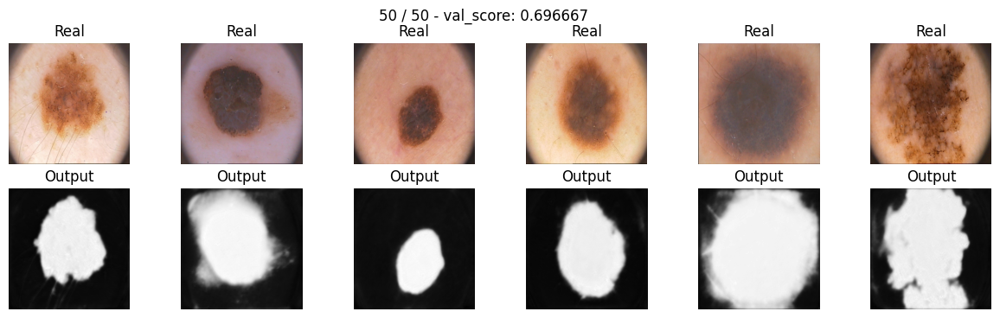

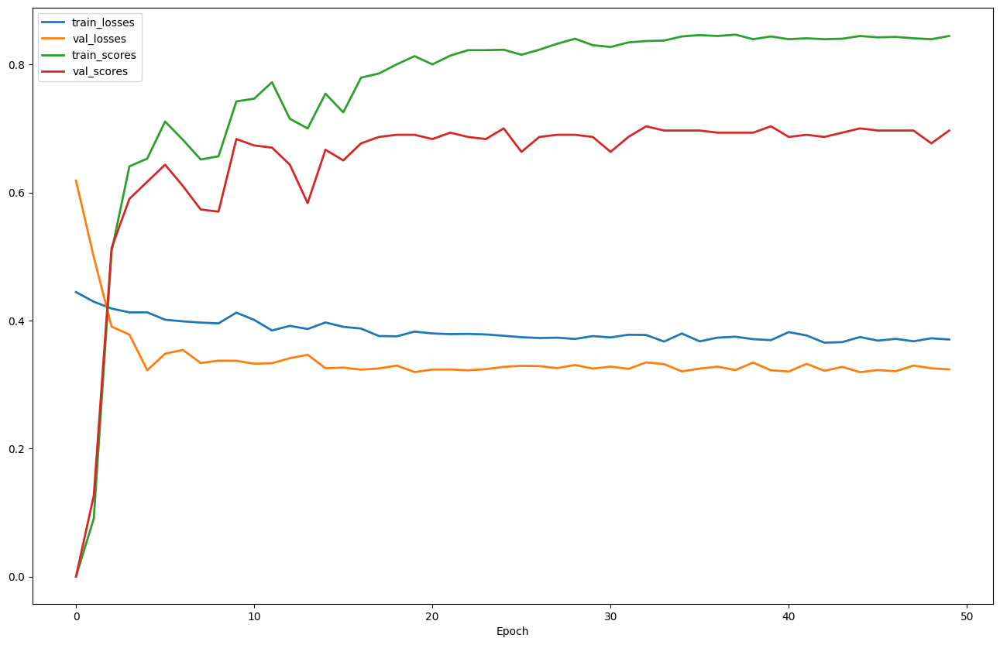

In [41]:
del unet_model_bce
unet_model_dice = UNet().to(device)
optim = torch.optim.AdamW(unet_model_dice.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet_dice_train_losses, unet_dice_val_losses, unet_dice_train_scores, unet_dice_val_scores = train(unet_model_dice, optim, scheduler, dice_loss, score_model, max_epochs, data_tr, data_val)

In [42]:
print('Validation score:', score_model(unet_model_dice, iou_pytorch, data_val))
print('Test score:', score_model(unet_model_dice, iou_pytorch, data_ts))

Validation score: 0.6966666579246521
Test score: 0.8100000421206156


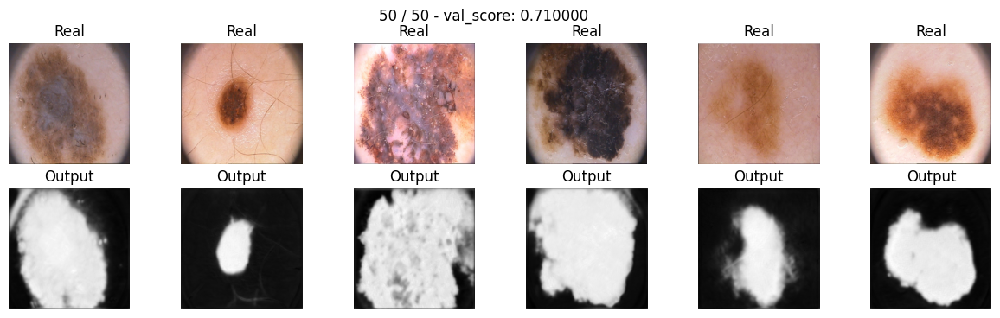

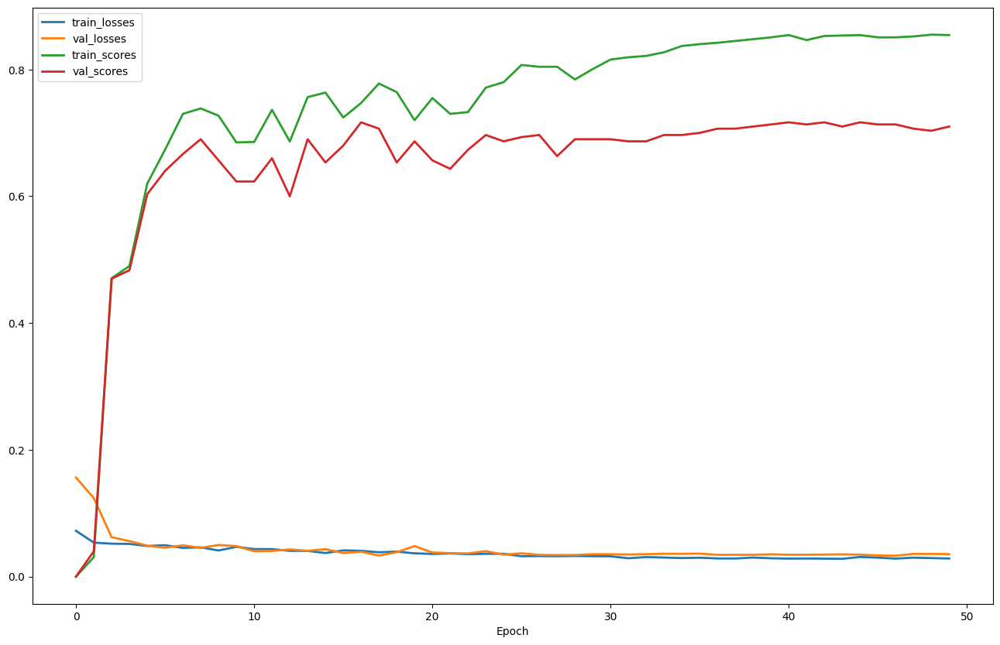

In [43]:
del unet_model_dice
unet_model_focal = UNet().to(device)
optim = torch.optim.AdamW(unet_model_focal.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet_focal_train_losses, unet_focal_val_losses, unet_focal_train_scores, unet_focal_val_scores = train(unet_model_focal, optim, scheduler, focal_loss, score_model, max_epochs, data_tr, data_val)

In [44]:
print('Validation score:', score_model(unet_model_focal, iou_pytorch, data_val))
print('Test score:', score_model(unet_model_focal, iou_pytorch, data_ts))

Validation score: 0.7100000182787577
Test score: 0.8266667326291403


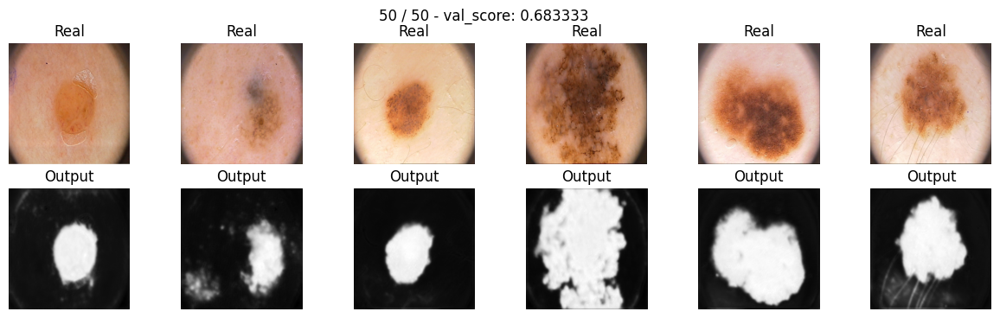

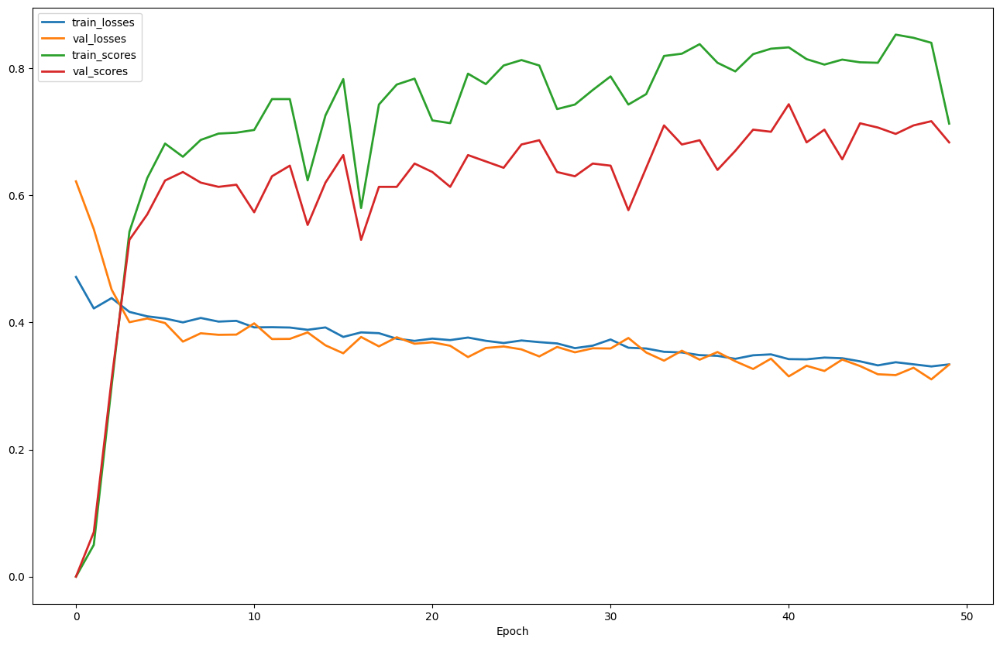

In [45]:
del unet_model_focal
unet_model_dice_bce = UNet().to(device)
optim = torch.optim.AdamW(unet_model_dice_bce.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet_dice_bce_train_losses, unet_dice_bce_val_losses, unet_dice_bce_train_scores, unet_dice_bce_val_scores = train(unet_model_dice_bce, optim, scheduler, dice_bce_loss, score_model, max_epochs, data_tr, data_val)

In [46]:
print('Validation score:', score_model(unet_model_dice_bce, iou_pytorch, data_val))
print('Test score:', score_model(unet_model_dice_bce, iou_pytorch, data_ts))

Validation score: 0.6833333770434061
Test score: 0.6166666944821676


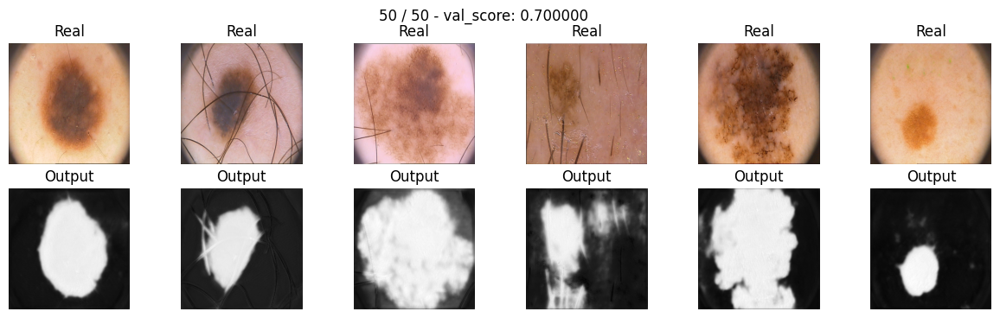

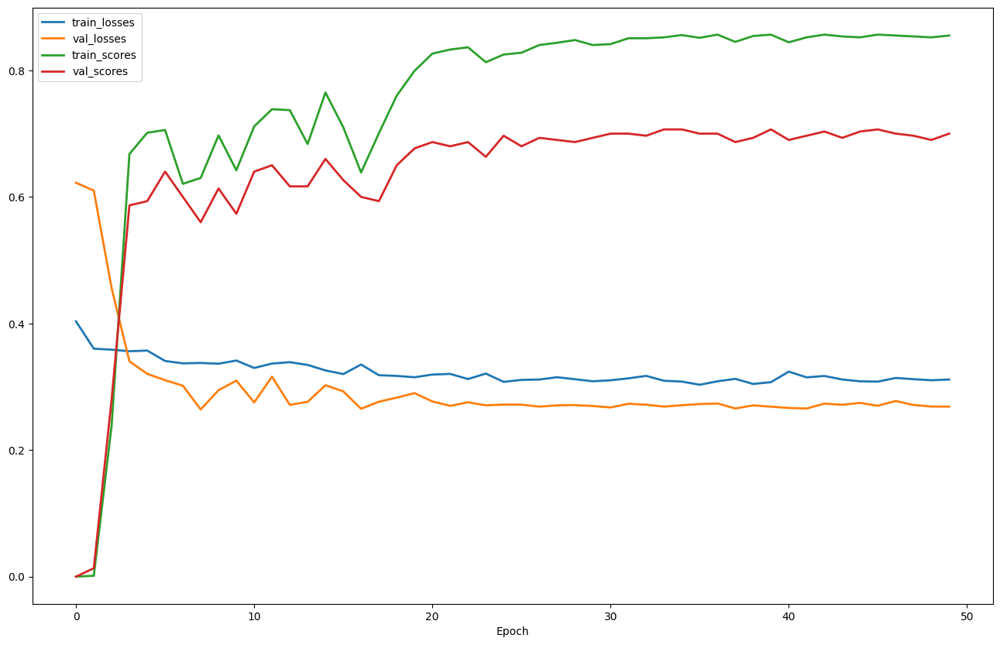

In [47]:
del unet_model_dice_bce
unet_model_tversky = UNet().to(device)
optim = torch.optim.AdamW(unet_model_tversky.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet_tversky_train_losses, unet_tversky_val_losses, unet_tversky_train_scores, unet_tversky_val_scores = train(unet_model_tversky, optim, scheduler, tversky_loss, score_model, max_epochs, data_tr, data_val)

In [48]:
print('Validation score:', score_model(unet_model_tversky, iou_pytorch, data_val))
print('Test score:', score_model(unet_model_tversky, iou_pytorch, data_ts))

Validation score: 0.7000000476837158
Test score: 0.8033334016799927


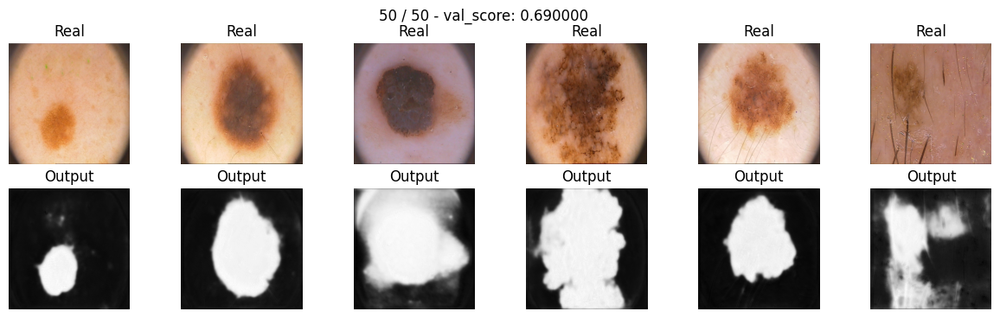

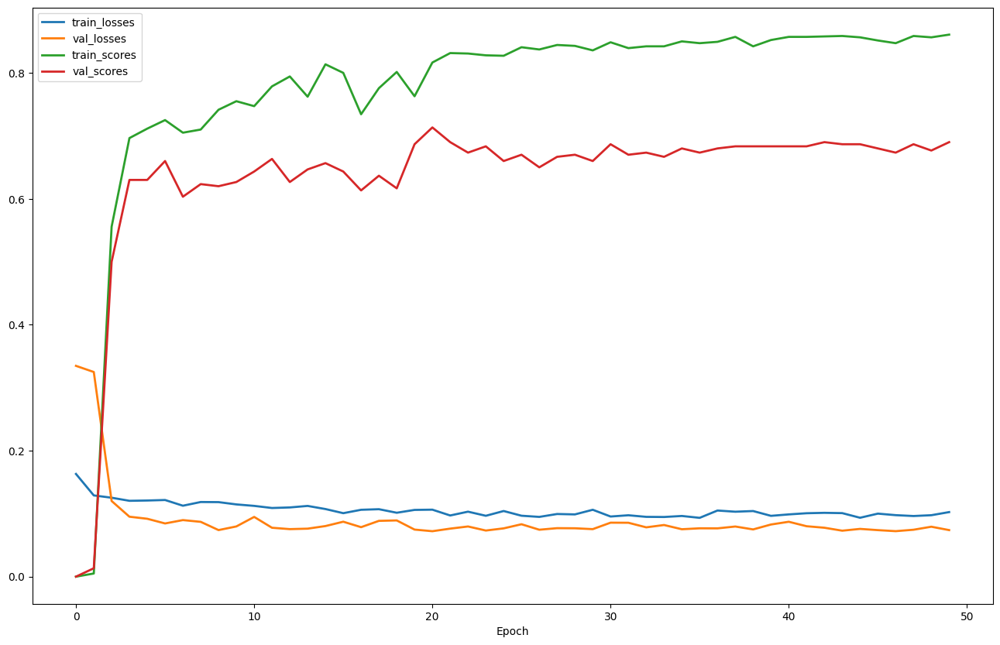

In [49]:
del unet_model_tversky
unet_model_focal_tversky = UNet().to(device)
optim = torch.optim.AdamW(unet_model_focal_tversky.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet_focal_tversky_train_losses, unet_focal_tversky_val_losses, unet_focal_tversky_train_scores, unet_focal_tversky_val_scores = train(unet_model_focal_tversky, optim, scheduler, focal_tversky_loss, score_model, max_epochs, data_tr, data_val)

In [50]:
print('Validation score:', score_model(unet_model_focal_tversky, iou_pytorch, data_val))
print('Test score:', score_model(unet_model_focal_tversky, iou_pytorch, data_ts))
del unet_model_focal_tversky

Validation score: 0.6900000174840292
Test score: 0.8033333420753479


Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


In [51]:
class UNet2(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU()
        )
        self.pool0 = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=2, padding=1)
        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU()
        )
        self.pool1 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=2, padding=1)
        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
        )
        self.pool2 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=2, padding=1)
        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
        )
        self.pool3 = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, stride=2, padding=1)
        
        # bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=1024, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(num_features=1024),
            nn.ReLU(),
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
        )

        # decoder (upsampling)
        self.upsample0 = nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=3, stride=2, padding=1)
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(in_channels=1024, out_channels=512, kernel_size=3, stride=1, padding=1),  
            nn.BatchNorm2d(num_features=512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
        )
        self.upsample1 = nn.ConvTranspose2d(in_channels=256, out_channels=256, kernel_size=3, stride=2, padding=1)
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
        )
        self.upsample2 = nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=3, stride=2, padding=1)
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
        )
        self.upsample3 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=3, stride=2, padding=1)
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64, out_channels=1, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(num_features=1),
        )

    def forward(self, x):
        # encoder
        e0 = self.enc_conv0(x)
        x = self.pool0(e0)
        e1 = self.enc_conv1(x)
        x = self.pool1(e1)
        e2 = self.enc_conv2(x)
        x = self.pool2(e2)
        e3 = self.enc_conv3(x)
        x = self.pool3(e3)

        # bottleneck
        bottleneck = self.bottleneck(x)

        # decoder
        d0 = self.dec_conv0(torch.cat([self.upsample0(bottleneck, output_size=e3.size()), e3], dim=1))
        d1 = self.dec_conv1(torch.cat([self.upsample1(d0, output_size=e2.size()), e2], dim=1))
        d2 = self.dec_conv2(torch.cat([self.upsample2(d1, output_size=e1.size()), e1], dim=1))
        d3 = self.dec_conv3(torch.cat([self.upsample3(d2, output_size=e0.size()), e0], dim=1))
        return d3

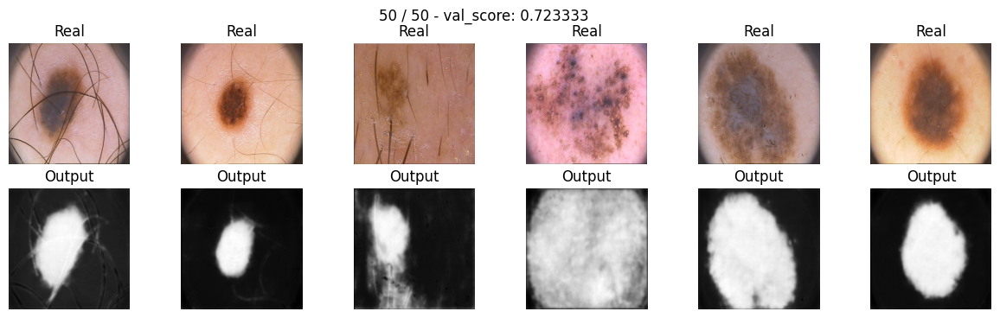

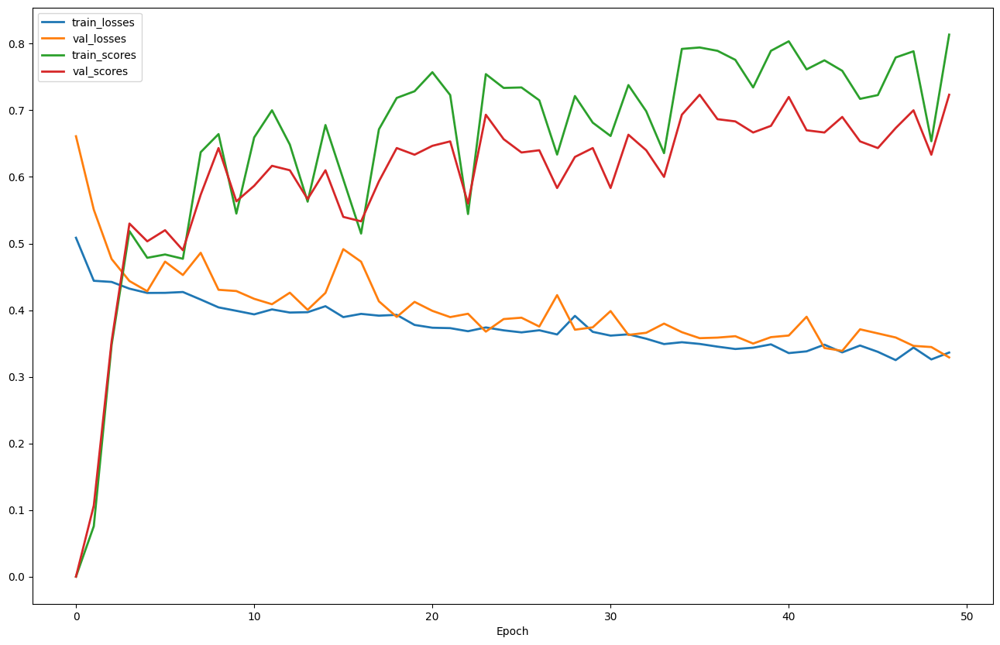

In [52]:
unet2_model_bce = UNet2().to(device)
optim = torch.optim.AdamW(unet2_model_bce.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet2_bce_train_losses, unet2_bce_val_losses, unet2_bce_train_scores, unet2_bce_val_scores = train(unet2_model_bce, optim, scheduler, bce_loss, score_model, max_epochs, data_tr, data_val)

In [53]:
print('Validation score:', score_model(unet2_model_bce, iou_pytorch, data_val))
print('Test score:', score_model(unet2_model_bce, iou_pytorch, data_ts))

Validation score: 0.7233333587646484
Test score: 0.7566666801770529


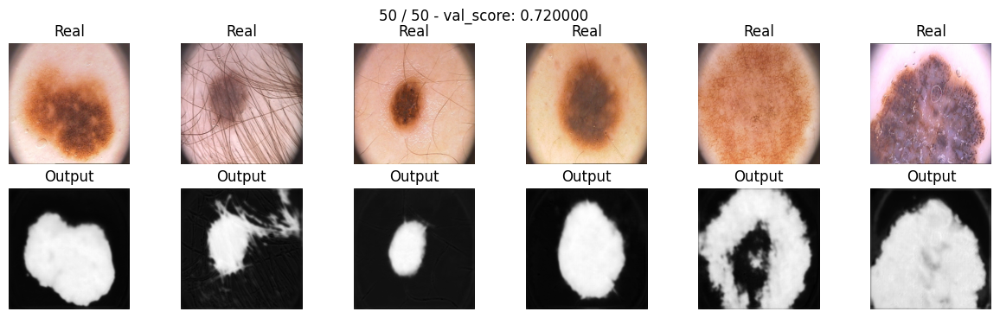

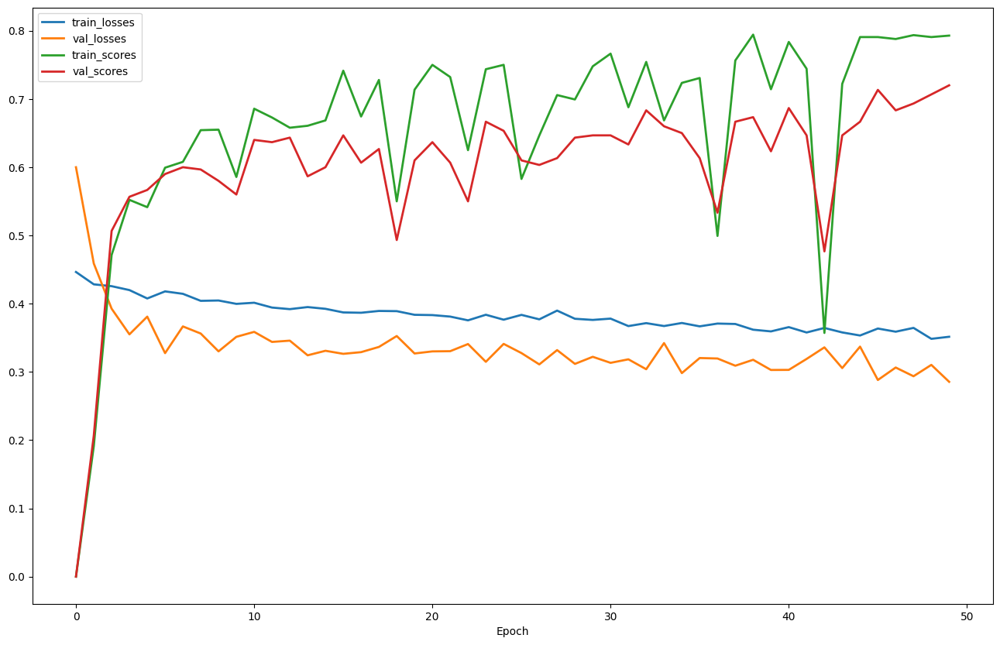

In [54]:
del unet2_model_bce
unet2_model_dice = UNet2().to(device)
optim = torch.optim.AdamW(unet2_model_dice.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet2_dice_train_losses, unet2_dice_val_losses, unet2_dice_train_scores, unet2_dice_val_scores = train(unet2_model_dice, optim, scheduler, dice_loss, score_model, max_epochs, data_tr, data_val)

In [55]:
print('Validation score:', score_model(unet2_model_dice, iou_pytorch, data_val))
print('Test score:', score_model(unet2_model_dice, iou_pytorch, data_ts))

Validation score: 0.7200000484784445
Test score: 0.7633333603541056


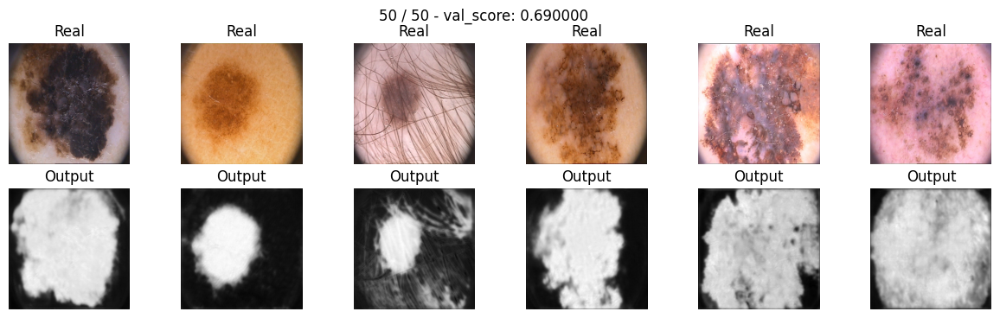

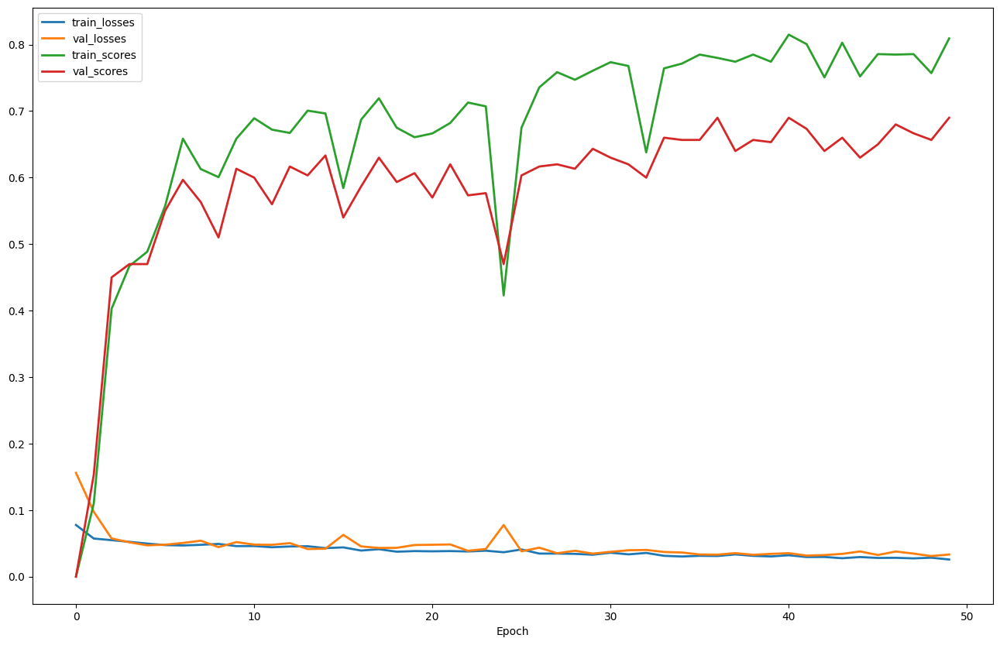

In [56]:
del unet2_model_dice
unet2_model_focal = UNet2().to(device)
optim = torch.optim.AdamW(unet2_model_focal.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet2_focal_train_losses, unet2_focal_val_losses, unet2_focal_train_scores, unet2_focal_val_scores = train(unet2_model_focal, optim, scheduler, focal_loss, score_model, max_epochs, data_tr, data_val)

In [57]:
print('Validation score:', score_model(unet2_model_focal, iou_pytorch, data_val))
print('Test score:', score_model(unet2_model_focal, iou_pytorch, data_ts))

Validation score: 0.690000057220459
Test score: 0.750000019868215


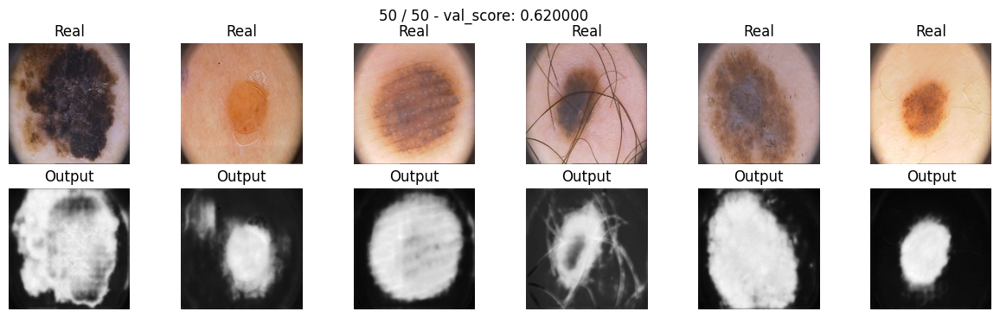

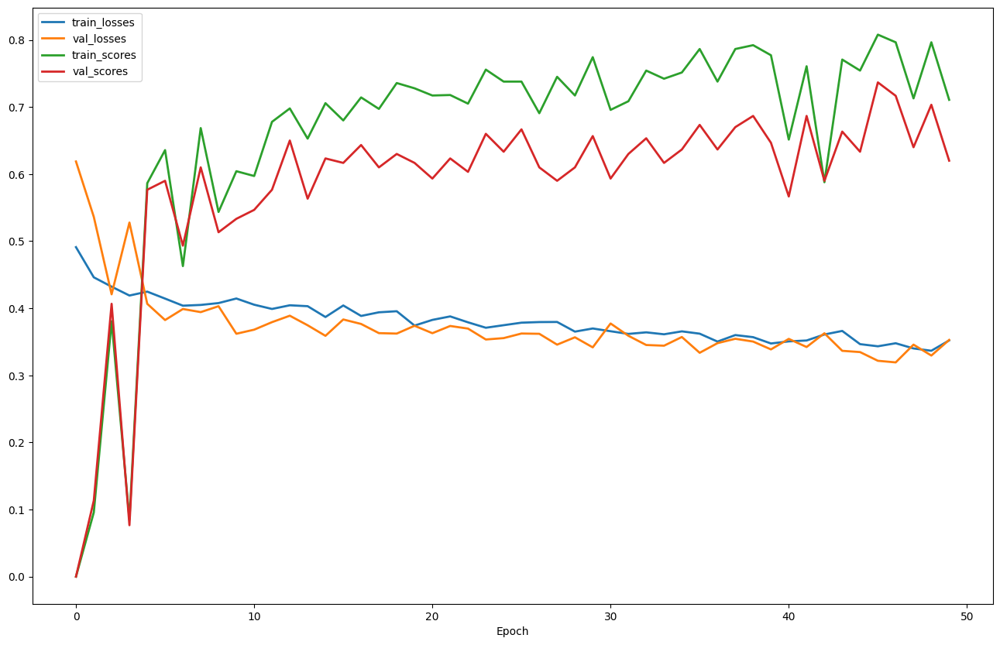

In [58]:
del unet2_model_focal
unet2_model_dice_bce = UNet2().to(device)
optim = torch.optim.AdamW(unet2_model_dice_bce.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet2_dice_bce_train_losses, unet2_dice_bce_val_losses, unet2_dice_bce_train_scores, unet2_dice_bce_val_scores = train(unet2_model_dice_bce, optim, scheduler, dice_bce_loss, score_model, max_epochs, data_tr, data_val)

In [59]:
print('Validation score:', score_model(unet2_model_dice_bce, iou_pytorch, data_val))
print('Test score:', score_model(unet2_model_dice_bce, iou_pytorch, data_ts))

Validation score: 0.6200000643730164
Test score: 0.6900000174840292


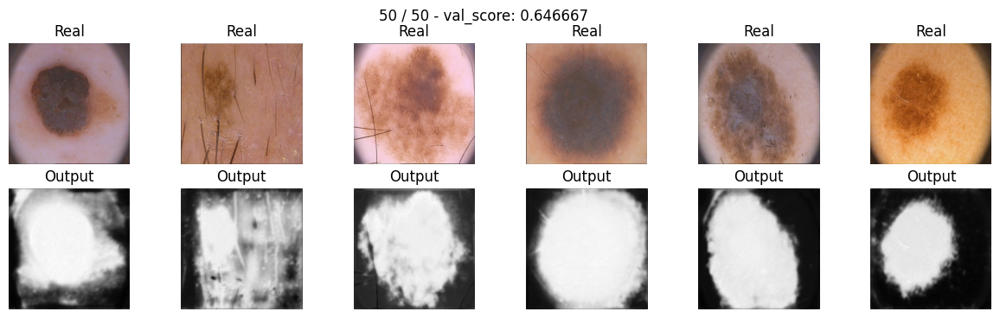

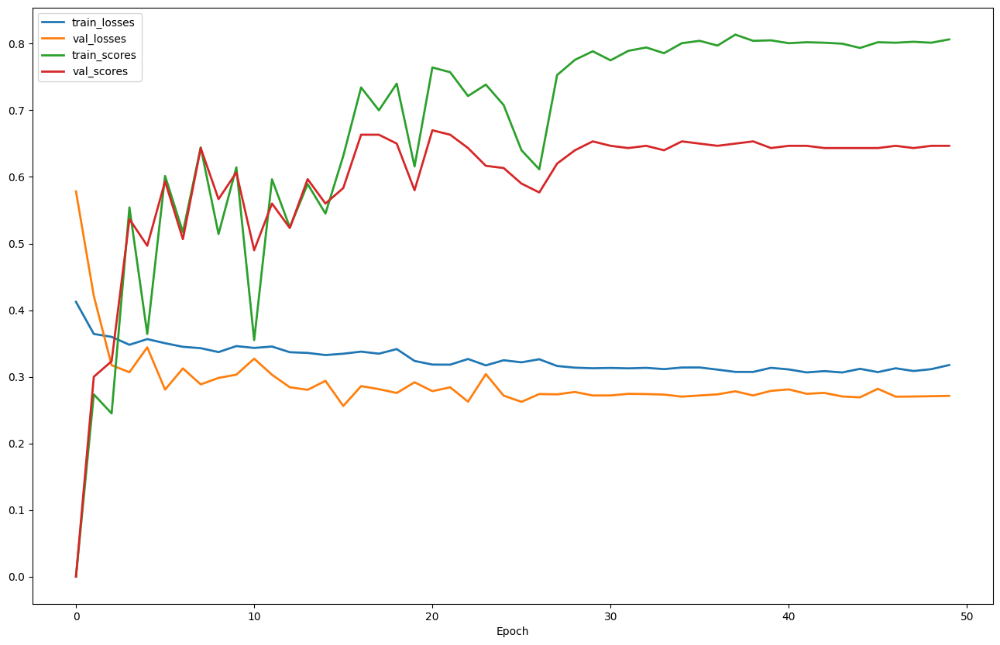

In [60]:
del unet2_model_dice_bce
unet2_model_tversky = UNet2().to(device)
optim = torch.optim.AdamW(unet2_model_tversky.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet2_tversky_train_losses, unet2_tversky_val_losses, unet2_tversky_train_scores, unet2_tversky_val_scores = train(unet2_model_tversky, optim, scheduler, tversky_loss, score_model, max_epochs, data_tr, data_val)

In [61]:
print('Validation score:', score_model(unet2_model_tversky, iou_pytorch, data_val))
print('Test score:', score_model(unet2_model_tversky, iou_pytorch, data_ts))

Validation score: 0.6466667056083679
Test score: 0.7700000007947286


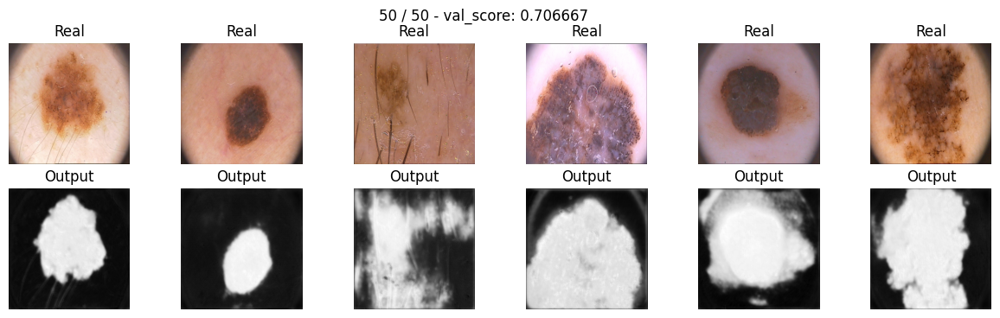

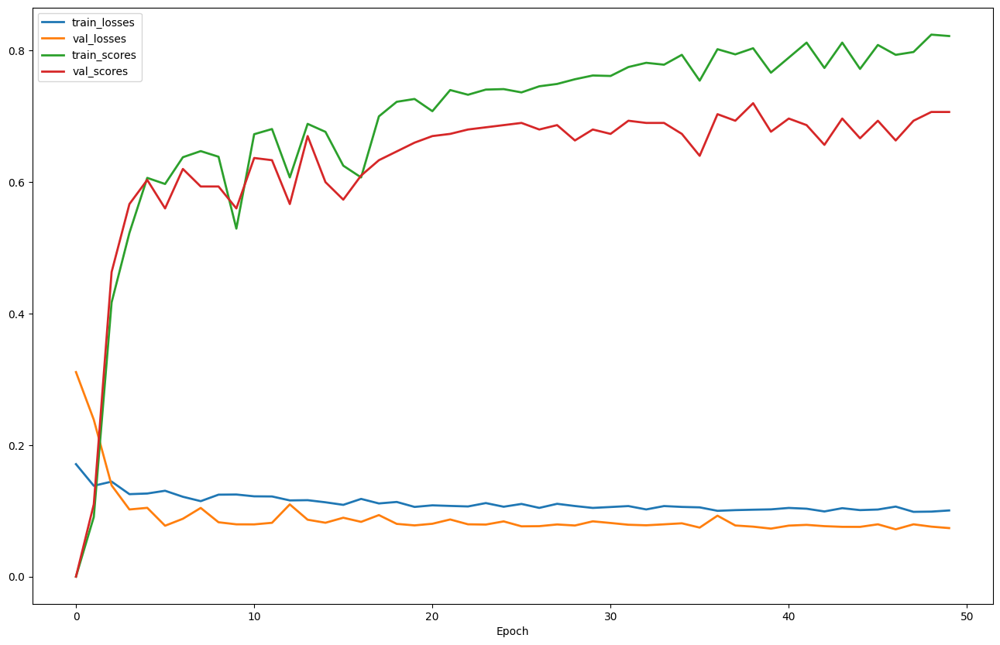

In [62]:
del unet2_model_tversky
unet2_model_focal_tversky = UNet2().to(device)
optim = torch.optim.AdamW(unet2_model_focal_tversky.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, 'min')
unet2_focal_tversky_train_losses, unet2_focal_tversky_val_losses, unet2_focal_tversky_train_scores, unet2_focal_tversky_val_scores = train(unet2_model_focal_tversky, optim, scheduler, focal_tversky_loss, score_model, max_epochs, data_tr, data_val)

In [63]:
print('Validation score:', score_model(unet2_model_focal_tversky, iou_pytorch, data_val))
print('Test score:', score_model(unet2_model_focal_tversky, iou_pytorch, data_ts))
del unet2_model_focal_tversky

Validation score: 0.7066666881243387
Test score: 0.7933333913485209


Сделайте вывод, какая из моделей лучше

# Отчет (6 баллов): 
Ниже предлагается написать отчет о проделанно работе и построить графики для лоссов, метрик на валидации и тесте. 
Если вы пропустили какую-то часть в задании выше, то вы все равно можете получить основную часть баллов в отчете, если правильно зададите проверяемые вами гипотезы.


Аккуратно сравните модели между собой и соберите наилучшую архитектуру. Проверьте каждую модель с различными лоссами. Мы не ограничиваем вас в формате отчета, но проверяющий должен отчетливо понять для чего построен каждый график, какие выводы вы из него сделали и какой общий вывод можно сделать на основании данных моделей. Если вы захотите добавить что-то еще, чтобы увеличить шансы получения максимального балла, то добавляйте отдельное сравнение.

Дополнительные комментарии: 

Пусть у вас есть N обученных моделей.
- Является ли отчетом N графиков с 1 линей? Да, но очень низкокачественным, потому что проверяющий не сможет сам сравнить их.

- Является ли отчетом 1 график с N линиями? Да, но скорее всего таким образом вы отразили лишь один эффект. Этого мало, чтобы сделать досточно суждений по поводу вашей работа.

- Я проверял метрики на трейне, и привел в результате таблицу с N числами, что не так? ключейвой момент тут, что вы измеряли на трейне ваши метрики, уверены ли вы, что заивисмости останутся такими же на отложенной выборке?

- Я сделал отчет содержащий график лоссов и метрик, и у меня нет ошибок в основной части, но за отчет не стоит максимум, почему? Естестественно максимум баллов за отчет можно получить не за 2 графика (даже при условии их полной правильности). Проверяющий хочет видеть больше сравнений моделей, чем метрики и лоссы (особенно, если они на трейне).

Советы: попробуйте правильно поставить вопрос на который вы себе отвечаете и продемонстрировать таблицу/график, помогающий проверяющему увидеть ответ на этот вопрос. Пример: Ваня хочет узнать, с каким из 4-х лоссов модель (например, U-Net) имеет наилучшее качество. Что нужно сделать Ване? Обучить 4 одинаковых модели с разными лосс функциями. И измерить итогововое качество. Продемонстрировать результаты своих измерений и итоговый вывод. (warning: конечно же, это не идеально ответит на наш вопрос, так как мы не учитываем в экспериментах возможные различные типы ошибок, но для первого приближения этого вполне достаточно).

Примерное время на подготовку отчета 1 час, он содержит сравнеение метрик, график лоссов, выбор лучших моделей из нескольких кластеров и выбор просто лучшей модели, небольшой вывод по всему дз, возможно сравнение результирующих сегментаций, времени или числа параметров модели, проявляйте креативность.






Сведём все графики для каждой из моделей для большей наглядности и найдём лучшую архитектуру для нашей задачи

#### Отчётные графики для модели SegNet

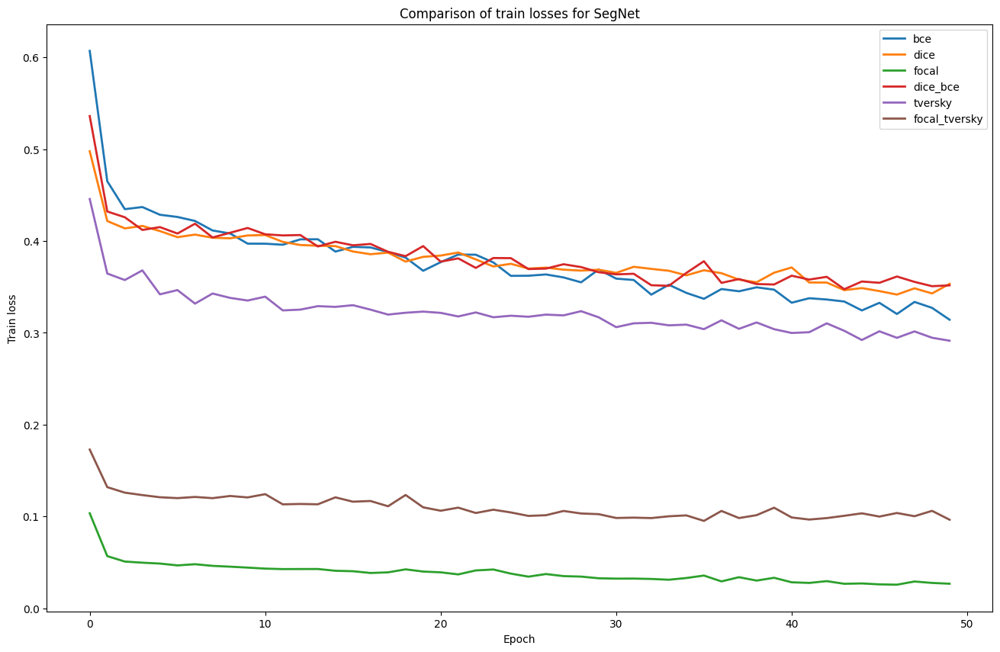

In [64]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), segnet_bce_train_losses, label="bce", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_train_losses, label="dice", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_train_losses, label="focal", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_bce_train_losses, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), segnet_tversky_train_losses, label="tversky", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_tversky_train_losses, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Train loss")
plt.title("Comparison of train losses for SegNet")
plt.show()

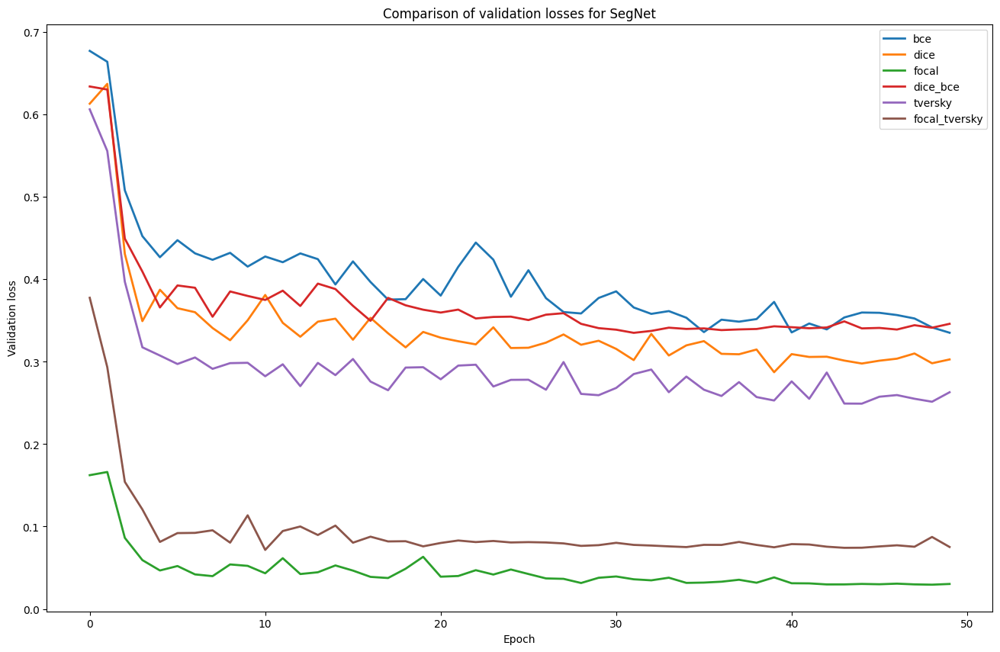

In [65]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), segnet_bce_val_losses, label="bce", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_val_losses, label="dice", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_val_losses, label="focal", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_bce_val_losses, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), segnet_tversky_val_losses, label="tversky", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_tversky_val_losses, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Validation loss")
plt.title("Comparison of validation losses for SegNet")
plt.show()

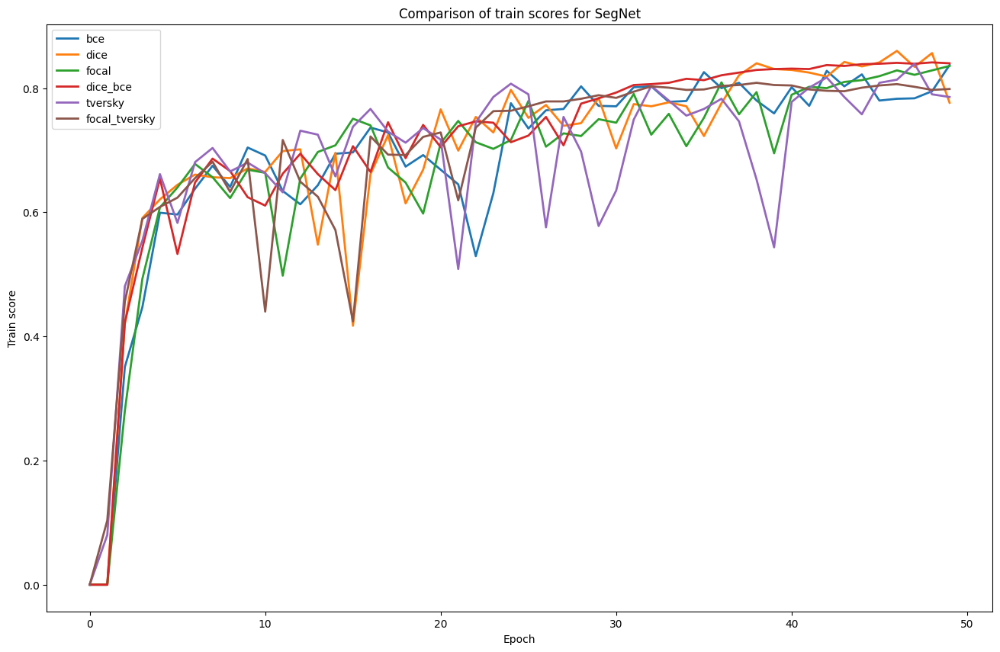

In [66]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), segnet_bce_train_scores, label="bce", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_train_scores, label="dice", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_train_scores, label="focal", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_bce_train_scores, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), segnet_tversky_train_scores, label="tversky", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_tversky_train_scores, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Train score")
plt.title("Comparison of train scores for SegNet")
plt.show()

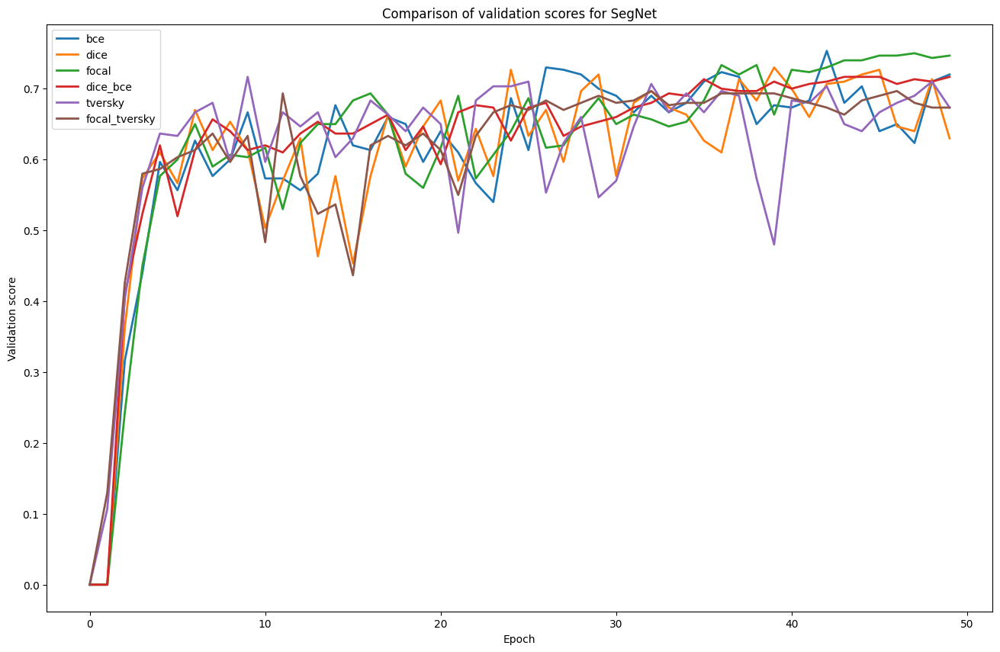

In [67]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), segnet_bce_val_scores, label="bce", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_val_scores, label="dice", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_val_scores, label="focal", linewidth=2)
plt.plot(range(max_epochs), segnet_dice_bce_val_scores, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), segnet_tversky_val_scores, label="tversky", linewidth=2)
plt.plot(range(max_epochs), segnet_focal_tversky_val_scores, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Validation score")
plt.title("Comparison of validation scores for SegNet")
plt.show()

Из графиков понятно, что наилучший результат для модели SegNet получился при использовании функции потерь focal.
Имеет место небольшое переобучение, т.к. есть разрыв между скорами на обучающей и валидационной выборке. Но так и должно быть, потому что датасет для обучения был очень маленький (всего лишь 140 изображений).

#### Отчётные графики для модели UNet

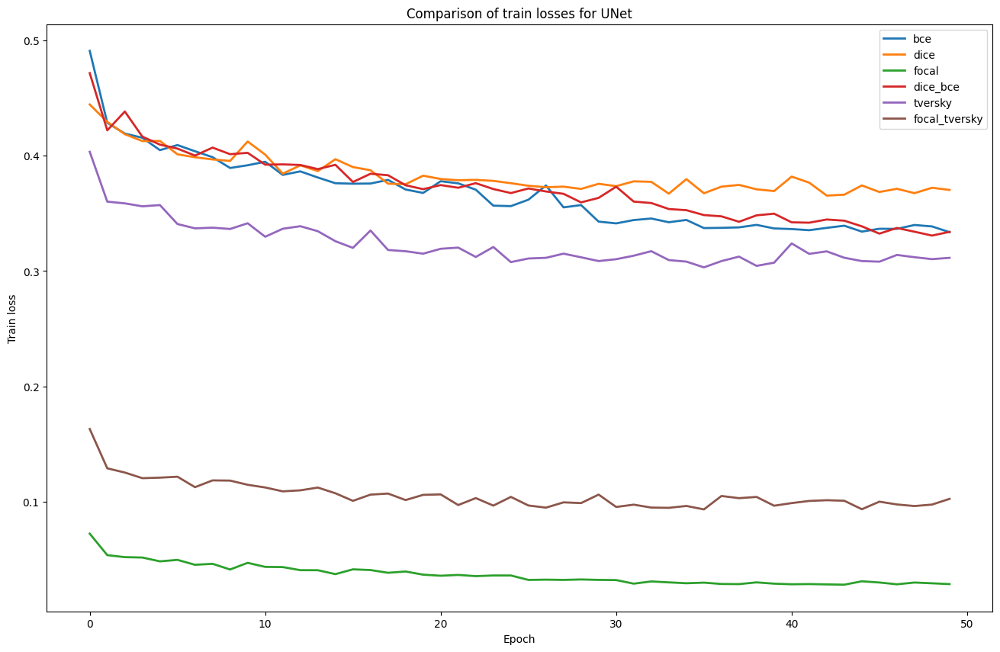

In [68]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), unet_bce_train_losses, label="bce", linewidth=2)
plt.plot(range(max_epochs), unet_dice_train_losses, label="dice", linewidth=2)
plt.plot(range(max_epochs), unet_focal_train_losses, label="focal", linewidth=2)
plt.plot(range(max_epochs), unet_dice_bce_train_losses, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), unet_tversky_train_losses, label="tversky", linewidth=2)
plt.plot(range(max_epochs), unet_focal_tversky_train_losses, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Train loss")
plt.title("Comparison of train losses for UNet")
plt.show()

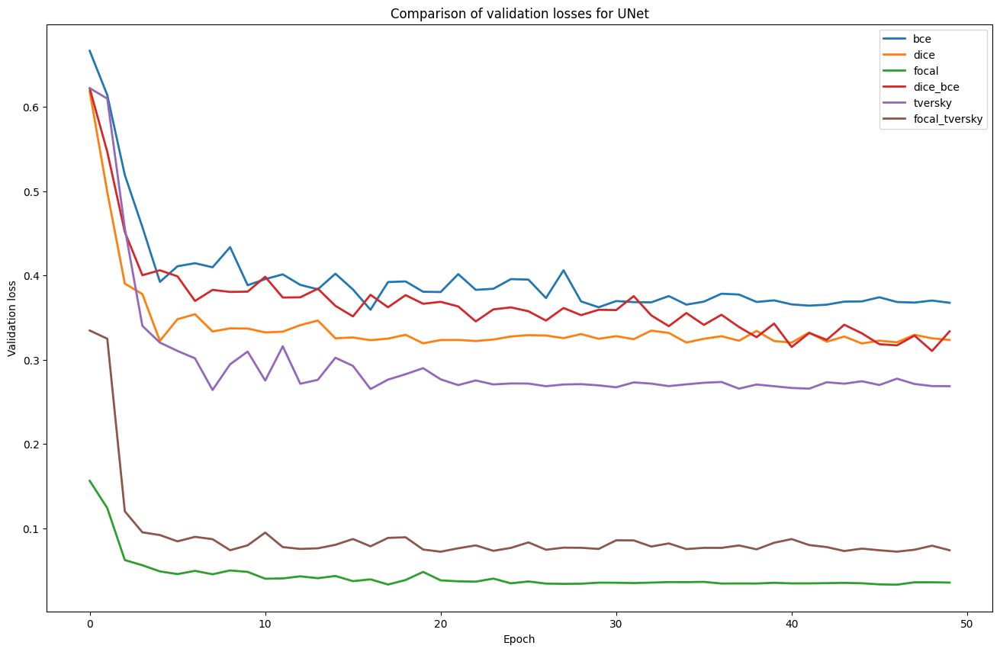

In [69]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), unet_bce_val_losses, label="bce", linewidth=2)
plt.plot(range(max_epochs), unet_dice_val_losses, label="dice", linewidth=2)
plt.plot(range(max_epochs), unet_focal_val_losses, label="focal", linewidth=2)
plt.plot(range(max_epochs), unet_dice_bce_val_losses, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), unet_tversky_val_losses, label="tversky", linewidth=2)
plt.plot(range(max_epochs), unet_focal_tversky_val_losses, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Validation loss")
plt.title("Comparison of validation losses for UNet")
plt.show()

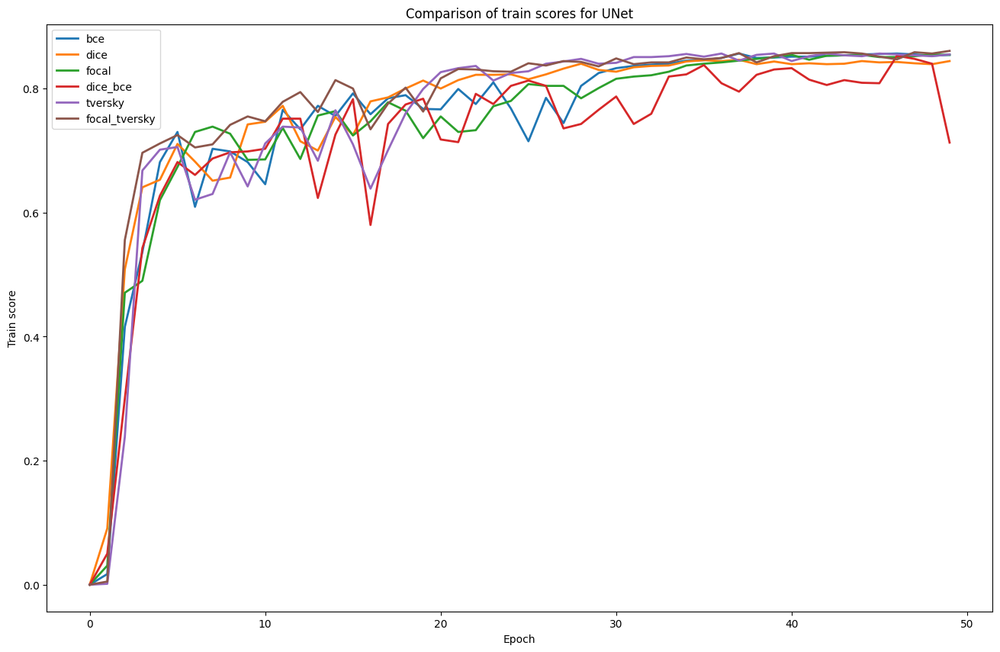

In [70]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), unet_bce_train_scores, label="bce", linewidth=2)
plt.plot(range(max_epochs), unet_dice_train_scores, label="dice", linewidth=2)
plt.plot(range(max_epochs), unet_focal_train_scores, label="focal", linewidth=2)
plt.plot(range(max_epochs), unet_dice_bce_train_scores, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), unet_tversky_train_scores, label="tversky", linewidth=2)
plt.plot(range(max_epochs), unet_focal_tversky_train_scores, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Train score")
plt.title("Comparison of train scores for UNet")
plt.show()

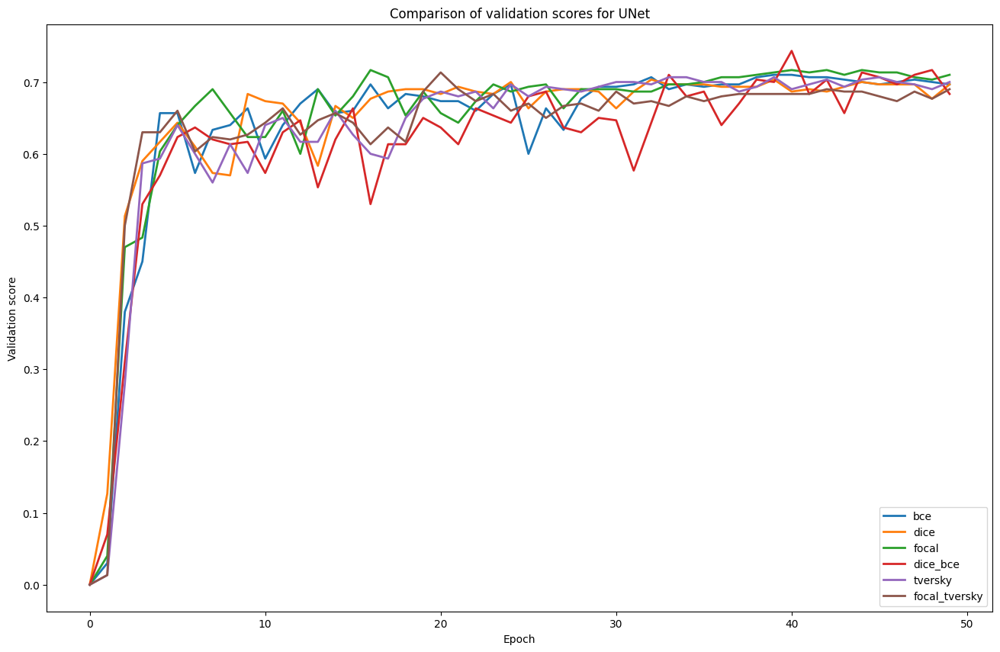

In [71]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), unet_bce_val_scores, label="bce", linewidth=2)
plt.plot(range(max_epochs), unet_dice_val_scores, label="dice", linewidth=2)
plt.plot(range(max_epochs), unet_focal_val_scores, label="focal", linewidth=2)
plt.plot(range(max_epochs), unet_dice_bce_val_scores, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), unet_tversky_val_scores, label="tversky", linewidth=2)
plt.plot(range(max_epochs), unet_focal_tversky_val_scores, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Validation score")
plt.title("Comparison of validation scores for UNet")
plt.show()

Из графиков понятно, что наилучший результат для модели UNet также получился при использовании функции потерь focal.
Имеет место небольшое переобучение, т.к. есть разрыв между скорами на обучающей и валидационной выборке. Но так и должно быть, потому что датасет для обучения был очень маленький (всего лишь 140 изображений).

#### Отчётные графики для модели UNet2

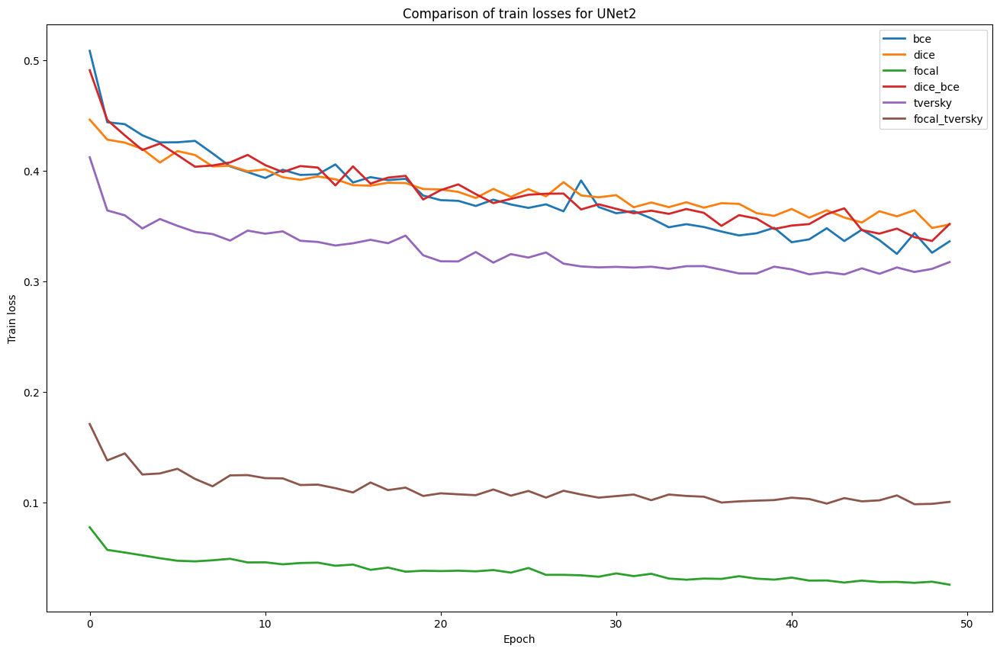

In [72]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), unet2_bce_train_losses, label="bce", linewidth=2)
plt.plot(range(max_epochs), unet2_dice_train_losses, label="dice", linewidth=2)
plt.plot(range(max_epochs), unet2_focal_train_losses, label="focal", linewidth=2)
plt.plot(range(max_epochs), unet2_dice_bce_train_losses, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), unet2_tversky_train_losses, label="tversky", linewidth=2)
plt.plot(range(max_epochs), unet2_focal_tversky_train_losses, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Train loss")
plt.title("Comparison of train losses for UNet2")
plt.show()

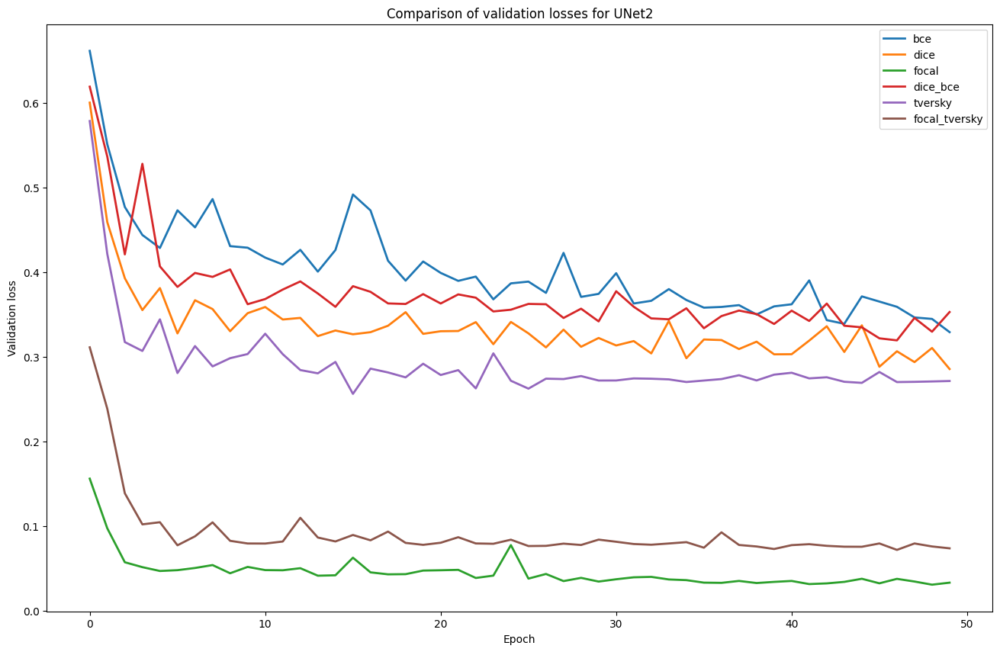

In [73]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), unet2_bce_val_losses, label="bce", linewidth=2)
plt.plot(range(max_epochs), unet2_dice_val_losses, label="dice", linewidth=2)
plt.plot(range(max_epochs), unet2_focal_val_losses, label="focal", linewidth=2)
plt.plot(range(max_epochs), unet2_dice_bce_val_losses, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), unet2_tversky_val_losses, label="tversky", linewidth=2)
plt.plot(range(max_epochs), unet2_focal_tversky_val_losses, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Validation loss")
plt.title("Comparison of validation losses for UNet2")
plt.show()

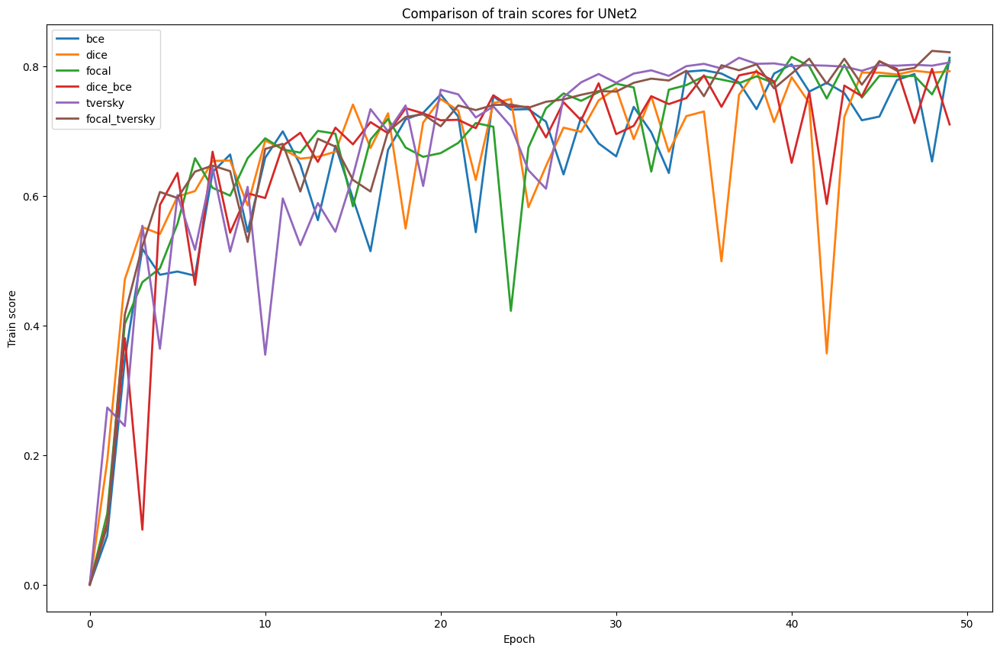

In [74]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), unet2_bce_train_scores, label="bce", linewidth=2)
plt.plot(range(max_epochs), unet2_dice_train_scores, label="dice", linewidth=2)
plt.plot(range(max_epochs), unet2_focal_train_scores, label="focal", linewidth=2)
plt.plot(range(max_epochs), unet2_dice_bce_train_scores, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), unet2_tversky_train_scores, label="tversky", linewidth=2)
plt.plot(range(max_epochs), unet2_focal_tversky_train_scores, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Train score")
plt.title("Comparison of train scores for UNet2")
plt.show()

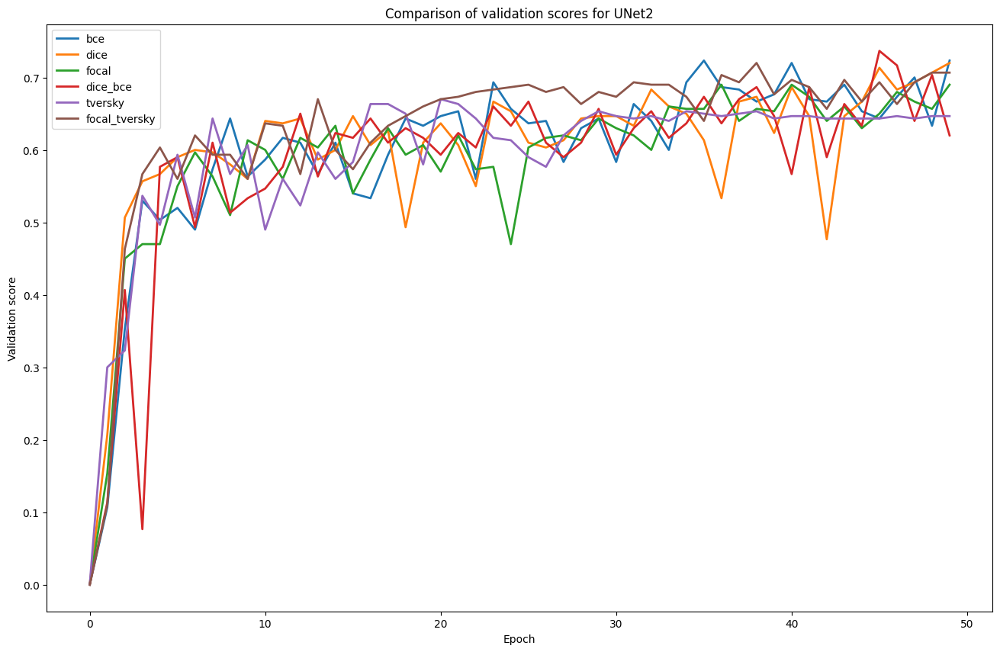

In [75]:
plt.figure(figsize=(16, 10))
plt.plot(range(max_epochs), unet2_bce_val_scores, label="bce", linewidth=2)
plt.plot(range(max_epochs), unet2_dice_val_scores, label="dice", linewidth=2)
plt.plot(range(max_epochs), unet2_focal_val_scores, label="focal", linewidth=2)
plt.plot(range(max_epochs), unet2_dice_bce_val_scores, label="dice_bce", linewidth=2)
plt.plot(range(max_epochs), unet2_tversky_val_scores, label="tversky", linewidth=2)
plt.plot(range(max_epochs), unet2_focal_tversky_val_scores, label="focal_tversky", linewidth=2)
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Validation score")
plt.title("Comparison of validation scores for UNet2")
plt.show()

Из графиков понятно, что наилучший результат для модели UNet2 получился при использовании функции потерь bce (функция потерь dice показала примерно такой же результат).
Имеет место небольшое переобучение, т.к. есть разрыв между скорами на обучающей и валидационной выборке. Но так и должно быть, потому что датасет для обучения был очень маленький (всего лишь 140 изображений).

В целом, если смотреть на скоры на валидационных выборках, то они находятся в диапазоне от 0.63 до 0.74. Скорее всего так произошло из-за того, что для валидации попались более сложные для сегментации изображения, чем для теста.

В целом, если смотреть на скор на тестовой выборке, то наилучший результат показывает архитектура UNet. Причём при использовании 5 из 6 функций потерь (кроме dice_bce), результат оказывается выше 0.8. Наибольший - при использовании функции потерь focal - 0.8266667326291403.